### Authors: Margherita Philipp & Daniela de los Santos


## Slums detection across four territories in the Global South

This notebook explores slum detection by training models in four different territories: Lower Nairobi (Kenya), Kibera (Kenya), Makoko (Nigeria) and Medellín (Colombia).

We attempt both within-slum prediction (i.e. training a model using data from a given slum, and making predictions on a test set within the same territory) and across-slum prediction (i.e. training a model using data from a given slum, and making predictions in a completely different territory).


### Load Libraries & Set Directory

In [1]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

!pip install segmentation-models-pytorch
!pip install -U git+https://github.com/albu/albumentations --no-cache-di

/kaggle/input/nigeria/Makoko_50cm.tif
/kaggle/input/nigeria/Makoko_50cm_large_ground_truth.tif
/kaggle/input/model-kib-l/model_kib_l.pt
/kaggle/input/test-dataloader-kib-l/test_dataloader_kib_l.pkl
/kaggle/input/kib-split/train_dataloader_kib.pkl
/kaggle/input/kib-split/valid_dataloader_kib.pkl
/kaggle/input/kib-split/test_dataloader_kib.pkl
/kaggle/input/nairobi-lower/Lower_30cm.tif
/kaggle/input/nairobi-lower/Lower_30cm_ground_truth.tif
/kaggle/input/data-colombia/DG/training/Medellin_40cm_large.jp2
/kaggle/input/data-colombia/DG/training/Medellin_ground_truth.tif
/kaggle/input/data-colombia/DG/training/Medellin_40cm.tif
/kaggle/input/informal-settlements/Kenya-Kibera/Kenya-Kibera/DG_Kibera_30cm.tif
/kaggle/input/informal-settlements/Kenya-Kibera/Kenya-Kibera/DG_Kibera_30cm_ground_truth.tif
/kaggle/input/informal-settlements/India-Mumbai/India-Mumbai/S2_Mumbai.tif
/kaggle/input/informal-settlements/India-Mumbai/India-Mumbai/S2_Mumbai_ground_truth.tif
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [2]:
# load packages
import os
import sys
import cv2
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm
import random

import rasterio
from rasterio.plot import show
from glob import glob
import shutil
import matplotlib.image as mpimg
from PIL import Image

import matplotlib.pyplot as plt
# Set up plotting options
%matplotlib inline

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

import pickle
from pickle import load

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import segmentation_models_pytorch as smp
from torch.utils.data import Dataset, TensorDataset, DataLoader

In [3]:
# Set path to where dataset is downloaded
dataset_root = '/kaggle/input/' 

# Import Images

We work with images of informal settlements/ slums. We have matching images and ground-truth masks of where the slum is and is not. We work with higher resolution images for slums in three areas:
- Nairobi (Kenya): two slums - Kibera and Lower Nairobi
- Makoko (Nigeria)
- Medellin (Colombia)

We also have images that we were hoping to use for ElDaien (Sudan) and Mumbai (India). However, the ElDaien file was too large to work with given the limited computing resources at hand and the Mumbai file was lower resulotion and had 10 rather than the expected 12 bands in the RGB channel, so we left to it aside. 

########################### KENYA - KIBERA ###########################
Ground Truth Shape: (6272, 13677)


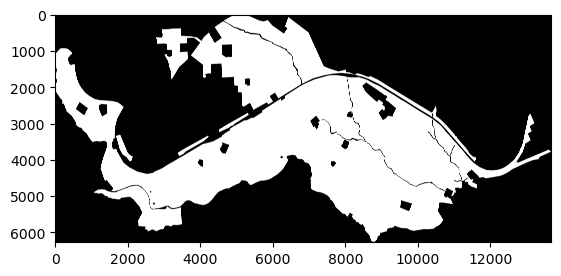

Satellite Image Shape: (6272, 13677, 3)


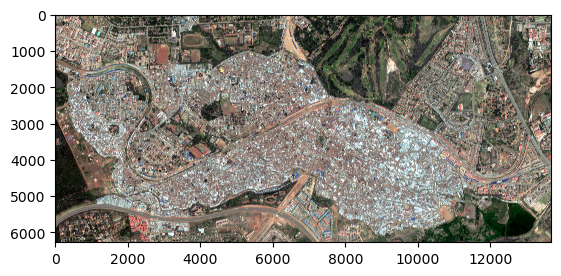

########################### KENYA - LOWER ###########################
Ground Truth Shape: (1426, 18535)


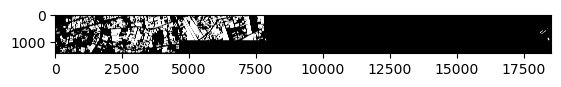

Satellite Image Shape: (1426, 18535, 3)


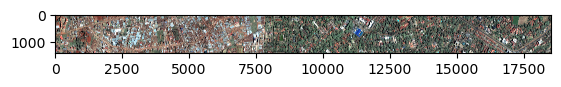

########################### NIGERIA - MAKOKO ###########################
Ground Truth Shape: (2980, 5375)


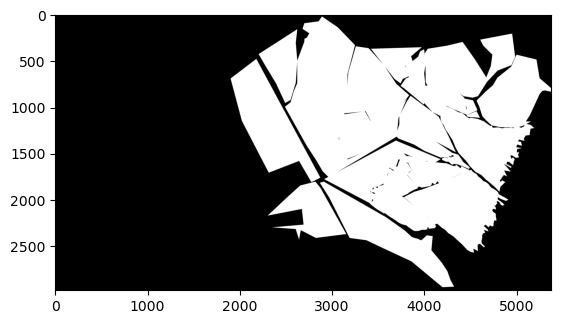

Satellite Image Shape: (2980, 5375, 3)


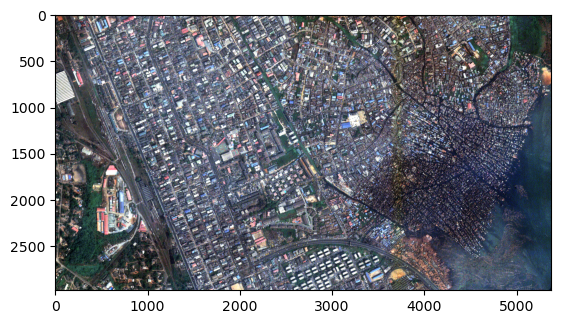

########################### COLOMBIA - MEDELLIN ###########################
Ground Truth Shape: (2519, 3579)


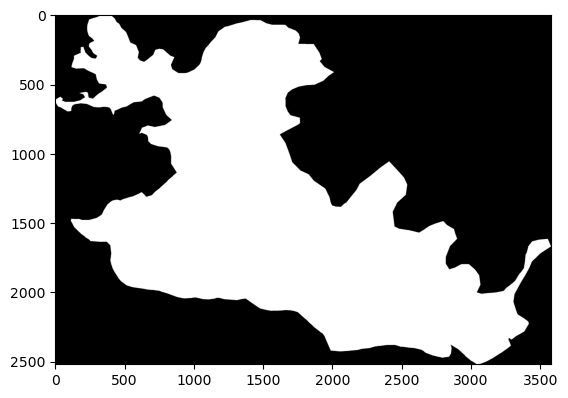

Satellite Image Shape: (2519, 3579, 3)


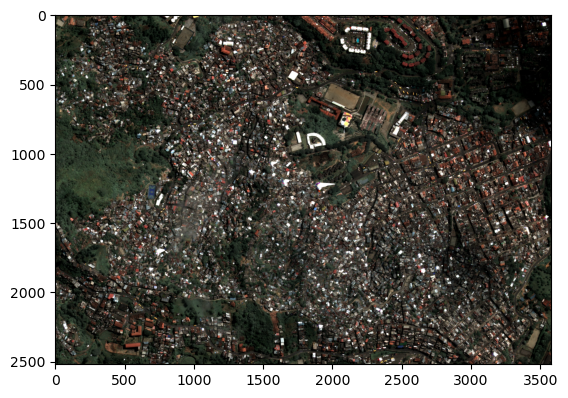

In [4]:
def process_dataset(image_path, mask_path, preprocess=False):
    # Load ground truth TIFF file
    with rasterio.open(mask_path) as ground_truth_file:
        ground_truth_masks = ground_truth_file.read(1)  # Read the first band

    # Load satellite image TIFF file
    with rasterio.open(image_path) as satellite_image_file:
        satellite_image_data = satellite_image_file.read()  # Read all bands

    # Preprocess and normalize the satellite image data if needed
    if preprocess:
        satellite_image_data = ((satellite_image_data - satellite_image_data.min()) / (satellite_image_data.max() - satellite_image_data.min()) * 255).astype(np.uint8)
    
    # Reshape satellite image data if it has three dimensions
    if satellite_image_data.ndim == 3:
        satellite_image_data = satellite_image_data.transpose(1, 2, 0)  # Transpose dimensions
        satellite_image_data = satellite_image_data[:, :, :3]  # Keep only the first three bands

    # Display ground truth and satellite image
    print('Ground Truth Shape:', ground_truth_masks.shape)
    plt.imshow(ground_truth_masks, cmap='gray')
    plt.show()

    print('Satellite Image Shape:', satellite_image_data.shape)
    plt.imshow(satellite_image_data)
    plt.show()
    
    return ground_truth_masks, satellite_image_data


# KENYA - KIBERA
print('########################### KENYA - KIBERA ###########################')
image_path_kib = os.path.join(dataset_root, 'informal-settlements/Kenya-Kibera/Kenya-Kibera/DG_Kibera_30cm.tif')
mask_path_kib = os.path.join(dataset_root, 'informal-settlements/Kenya-Kibera/Kenya-Kibera/DG_Kibera_30cm_ground_truth.tif')
ground_truth_masks_kib, satellite_image_data_kib = process_dataset(image_path_kib, mask_path_kib, preprocess=True)

# KENYA - LOWER NAIROBI
print('########################### KENYA - LOWER ###########################')
image_path_kib_l = os.path.join(dataset_root, 'nairobi-lower/Lower_30cm.tif')
mask_path_kib_l = os.path.join(dataset_root, 'nairobi-lower/Lower_30cm_ground_truth.tif')
ground_truth_masks_kib_l, satellite_image_data_kib_l = process_dataset(image_path_kib_l, mask_path_kib_l, preprocess=True)


# NIGERIA - MAKOKO
print('########################### NIGERIA - MAKOKO ###########################')
image_path_mak = os.path.join(dataset_root, 'nigeria/Makoko_50cm.tif')
mask_path_mak = os.path.join(dataset_root, 'nigeria/Makoko_50cm_large_ground_truth.tif')
ground_truth_masks_mak, satellite_image_data_mak = process_dataset(image_path_mak, mask_path_mak, preprocess=False)


# COLOMBIA - MEDELLIN
print('########################### COLOMBIA - MEDELLIN ###########################')
image_path_med = os.path.join(dataset_root, 'data-colombia/DG/training/Medellin_40cm.tif')
mask_path_med = os.path.join(dataset_root, 'data-colombia/DG/training/Medellin_ground_truth.tif')
ground_truth_masks_med, satellite_image_data_med = process_dataset(image_path_med, mask_path_med, preprocess=False)


In [5]:
#################################################################################################################################################
# SUDAN - ELDAIEN - running this cell usually causes the notebook to crash
#################################################################################################################################################
print('########################### SUDAN - ELDAIEN (omitted) ###########################')

# Load ground truth TIFF file
#ground_truth_path_eld = os.path.join(dataset_root, 'sudan-eldaien/ElDaien_40cm_ground_truth_corrected.tif')
#with rasterio.open(ground_truth_path_eld) as ground_truth_file_eld:
#    ground_truth_masks_eld = ground_truth_file_eld.read(1)  # Read the first band
    
# Load satellite image TIFF file
#satellite_image_path_eld = os.path.join(dataset_root, 'sudan-eldaien/ElDaien_40cm.tif') 
#with rasterio.open(satellite_image_path_eld) as satellite_image_file_eld:
#    satellite_image_data_eld = satellite_image_file_eld.read()  # Read all bands

# Preprocess and normalize the satellite image data if needed
#satellite_image_data_eld = (satellite_image_data_eld - satellite_image_data_eld.min()) / (satellite_image_data_eld.max() - satellite_image_data_eld.min())

## Display ground truth and satellite image
#print(ground_truth_masks_eld.shape)
#show(ground_truth_masks_eld, cmap='gray')

#print(satellite_image_data_eld.shape)
#show(satellite_image_data_eld)


#################################################################################################################################################
# INDIA - MUMBAI 
#################################################################################################################################################
print('########################### INDIA - MUMBAI (not used) ###########################')

# Load ground truth TIFF file
#ground_truth_path_mum = os.path.join(dataset_root, 'informal-settlements/India-Mumbai/India-Mumbai/S2_Mumbai_ground_truth.tif')
#with rasterio.open(ground_truth_path_mum) as ground_truth_file_mum:
#    ground_truth_masks_mum = ground_truth_file_mum.read(1)  # Read the first band

# Load satellite image TIFF file
#satellite_image_path_mum = os.path.join(dataset_root, 'informal-settlements/India-Mumbai/India-Mumbai/S2_Mumbai.tif') 
#with rasterio.open(satellite_image_path_mum) as satellite_image_file_mum:
#    satellite_image_data_mum = satellite_image_file_mum.read()  # Read all bands
    
# Preprocess and normalize the satellite image data if needed
#satellite_image_data_mum = (satellite_image_data_mum - satellite_image_data_mum.min()) / (satellite_image_data_mum.max() - satellite_image_data_mum.min())

# Display ground truth
#print(ground_truth_masks_mum.shape)
#show(ground_truth_masks_mum, cmap='gray')

# Select the first three or last three channels as RGB
#print(satellite_image_data_mum.shape)
#rgb_channels = satellite_image_data_mum[7,:, :]  # Select last three channels and transpose
#print(rgb_channels.shape)
#show(rgb_channels)

########################### SUDAN - ELDAIEN (omitted) ###########################
########################### INDIA - MUMBAI (not used) ###########################


In [6]:
#with rasterio.open(satellite_image_path) as satellite_image_file:
#    # Retrieve the dimensions of the image
#    image_height = satellite_image_file.height
#    image_width = satellite_image_file.width
#    num_channels = satellite_image_file.count

# Print the dimensions
#print(f"Image Height: {image_height}")
#print(f"Image Width: {image_width}")
#print(f"Number of Channels: {num_channels}")


### Inspecting dimensions and pixel values

In [7]:
suffixes = ['kib', 'kib_l', 'mak', 'med'] # alphabetical order throughout

for suffix in suffixes:
    image_data = globals().get(f'satellite_image_data_{suffix}')
    truth_data = globals().get(f'ground_truth_masks_{suffix}')
    #if image_data is not None:
    print('##', suffix)
    print('Image shape and pixels')
    print(image_data.shape)
    print(image_data[1][800:803][:])
    print('Ground truth shape and pixels')
    print(truth_data.shape)
    print(truth_data[800:803])
    

## kib
Image shape and pixels
(6272, 13677, 3)
[[129 102  90]
 [129 102  90]
 [133 106  90]]
Ground truth shape and pixels
(6272, 13677)
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
## kib_l
Image shape and pixels
(1426, 18535, 3)
[[36 12 14]
 [37 13 17]
 [58 35 39]]
Ground truth shape and pixels
(1426, 18535)
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
## mak
Image shape and pixels
(2980, 5375, 3)
[[ 76  65 127]
 [ 86  83 143]
 [ 97 100 154]]
Ground truth shape and pixels
(2980, 5375)
[[0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]]
## med
Image shape and pixels
(2519, 3579, 3)
[[255 247 229]
 [255 248 236]
 [242 219 210]]
Ground truth shape and pixels
(2519, 3579)
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [8]:
# Convert the satellite image data to a suitable data type and range (e.g., uint8, 0-255)
#satellite_image_data_kib = ((satellite_image_data_kib - satellite_image_data_kib.min()) / (satellite_image_data_kib.max() - satellite_image_data_kib.min()) * 255).astype(np.uint8)
#satellite_image_data_mak = ((satellite_image_data_mak - satellite_image_data_mak.min()) / (satellite_image_data_mak.max() - satellite_image_data_mak.min()) * 255).astype(np.uint8)
#satellite_image_data_med = ((satellite_image_data_med - satellite_image_data_med.min()) / (satellite_image_data_med.max() - satellite_image_data_med.min()) * 255).astype(np.uint8)


kib 0 1 0 255


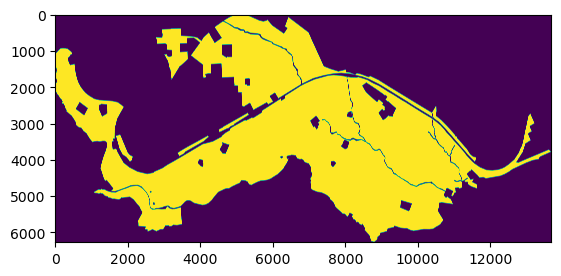

kib_l 0 1 0 255


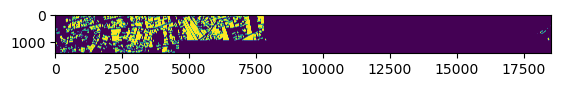

mak 0 0 0 255


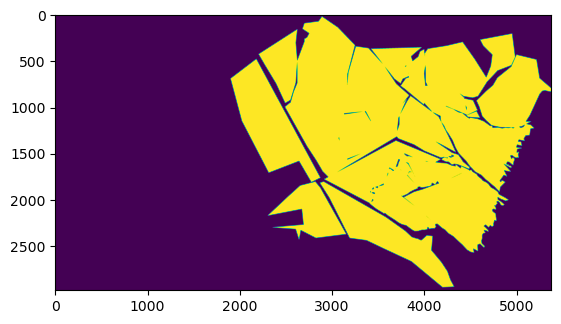

med 0 0 0 255


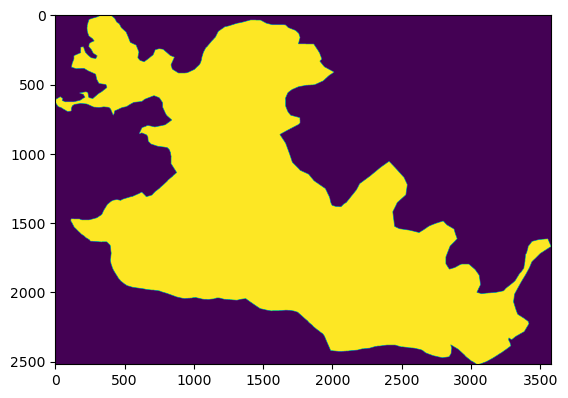

In [9]:
# Convert the ground truth masks to uint8
ground_truth_masks_kib = ground_truth_masks_kib.astype(np.uint8)
ground_truth_masks_kib_l = ground_truth_masks_kib_l.astype(np.uint8)
ground_truth_masks_mak = ground_truth_masks_mak.astype(np.uint8)
ground_truth_masks_med = ground_truth_masks_med.astype(np.uint8)

for suffix in suffixes:
    image_data = globals().get(f'satellite_image_data_{suffix}')
    truth_data = globals().get(f'ground_truth_masks_{suffix}')
    print(suffix, truth_data[0].min(), truth_data[0].max(), image_data[0].min(), image_data[0].max())
    show(truth_data)

In [10]:
# Convert the satellite image data to a suitable data type and range (e.g., uint8, 0-255)
#satellite_image_data = ((satellite_image_data - satellite_image_data.min()) / (satellite_image_data.max() - satellite_image_data.min()) * 255).astype(np.uint8)

# Convert the ground truth masks to uint8
# ground_truth_masks = ground_truth_masks.astype(np.uint8)

# Create PIL images from the arrays
#satellite_image_pil = Image.fromarray(satellite_image_data.transpose(1, 2, 0))
#ground_truth_label_pil = Image.fromarray(ground_truth_masks)

# Generate tiles
In order to work with these images we need to split them into equally sized tiles. Then we can split them into test, train and validation samples for each informal settlement.

In [11]:
def generate_tiles_and_labels(satellite_image_data, ground_truth_masks, tile_size=256):
    # Load satellite image TIFF file
    #with rasterio.open(image_path) as image_file:
    #    satellite_image_data = image_file.read()  # Read all bands

    # Load ground truth TIFF file
    #with rasterio.open(mask_path) as mask_file:
    #    ground_truth_masks = mask_file.read(1)  # Read the first band
    
    # Convert the satellite image data to a suitable data type and range (e.g., uint8, 0-255)
    #satellite_image_data = ((satellite_image_data - satellite_image_data.min()) / (satellite_image_data.max() - satellite_image_data.min()) * 255).astype(np.uint8)
    satellite_image_data = satellite_image_data.astype(np.uint8)

    # Create PIL images from the arrays
    satellite_image_pil = Image.fromarray(satellite_image_data) #.transpose(1, 2, 0))
    ground_truth_label_pil = Image.fromarray(ground_truth_masks)

    # Generate tiles and labels
    tile_size = 256  # preferred size as needs to be divisible by 32 for model
    tiles_labels = []
    for y in range(0, satellite_image_pil.height, tile_size):
        for x in range(0, satellite_image_pil.width, tile_size):
            tile = satellite_image_pil.crop((x, y, x + tile_size, y + tile_size))
            label = ground_truth_label_pil.crop((x, y, x + tile_size, y + tile_size))
            tiles_labels.append((np.array(tile).astype(np.float64) / 255.0, np.array(label).astype(np.int64)))

    # Convert the tiles and labels to numpy arrays
    tiles, labels = zip(*tiles_labels)
    tiles = np.array(tiles)
    labels = np.array(labels)

    return tiles, labels


In [12]:
# Generate tiles
tiles_kib, labels_kib = generate_tiles_and_labels(satellite_image_data_kib, ground_truth_masks_kib)
tiles_kib_l, labels_kib_l = generate_tiles_and_labels(satellite_image_data_kib_l, ground_truth_masks_kib_l)
tiles_mak, labels_mak = generate_tiles_and_labels(satellite_image_data_mak, ground_truth_masks_mak)
tiles_med, labels_med = generate_tiles_and_labels(satellite_image_data_med, ground_truth_masks_med)

# Generate tiles
for suffix in suffixes:
    tiles = globals().get(f'tiles_{suffix}')
    labels = globals().get(f'labels_{suffix}')
    print(suffix)
    print('TILES min & max:', tiles.min(), tiles.max())
    print('LABELS min & max', labels.max(), labels.min())


kib
TILES min & max: 0.0 1.0
LABELS min & max 1 0
kib_l
TILES min & max: 0.0 1.0
LABELS min & max 1 0
mak
TILES min & max: 0.0 1.0
LABELS min & max 1 0
med
TILES min & max: 0.0 1.0
LABELS min & max 1 0


In [13]:
def visualize_tiles_and_labels(tiles, labels, num_rows, num_cols, figdim_a, figdim_b):
    total_tiles = num_rows * num_cols

    # Create a figure and axis objects for plotting
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(figdim_a,figdim_b))

    # Iterate through the tiles and display them in the subplot grid
    for i, ax in enumerate(axes.flat):
        if i < total_tiles and i < len(tiles):
            tile = tiles[i]

            # Normalize each band individually to 0-1 range
            normalized_tile = tile / np.max(tile, axis=(0, 1))

            # Apply gamma correction if needed
            gamma = 1.0  # Adjust gamma value if necessary
            gamma_corrected_tile = normalized_tile ** (1.0 / gamma)

            # Map the appropriate bands to the RGB channels
            rgb_tile = gamma_corrected_tile[:, :, [2, 1, 0]]  # Assuming the order is BGR, adjust if needed

            ax.imshow(rgb_tile)
            ax.axis('off')
        else:
            ax.axis('off')

    # Adjust the layout and spacing of the subplots
    plt.tight_layout()

    # Show the plot
    plt.show()

    # Create a figure and axis objects for plotting
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(figdim_a,figdim_b))

    # Iterate through the label tiles and display them in the subplot grid
    for i, ax in enumerate(axes.flat):
        if i < total_tiles and i < len(labels):
            label = labels[i]

            ax.imshow(label, cmap='gray')
            ax.axis('off')
        else:
            ax.axis('off')

    # Adjust the layout and spacing of the subplots
    plt.tight_layout()

    # Show the plot
    plt.show()


kib


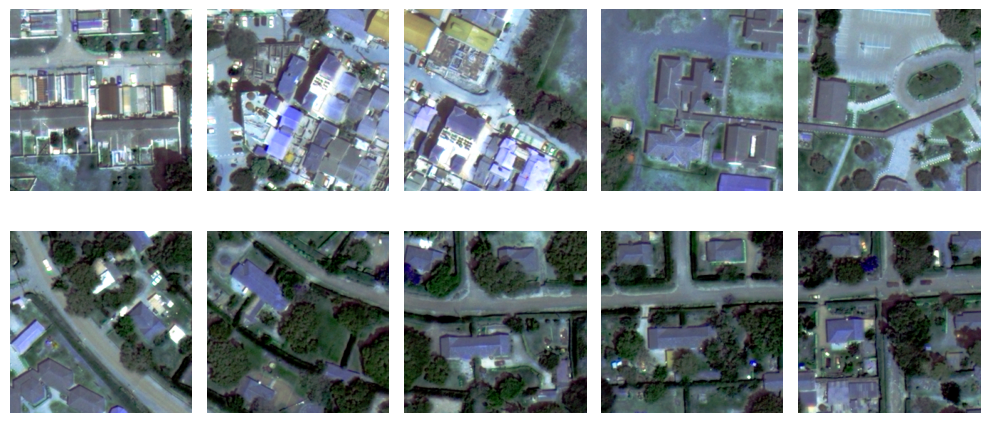

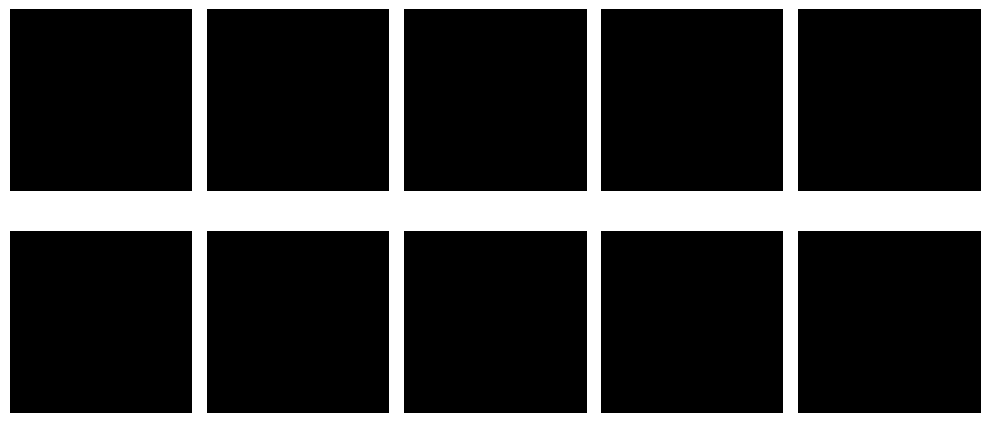

kib_l


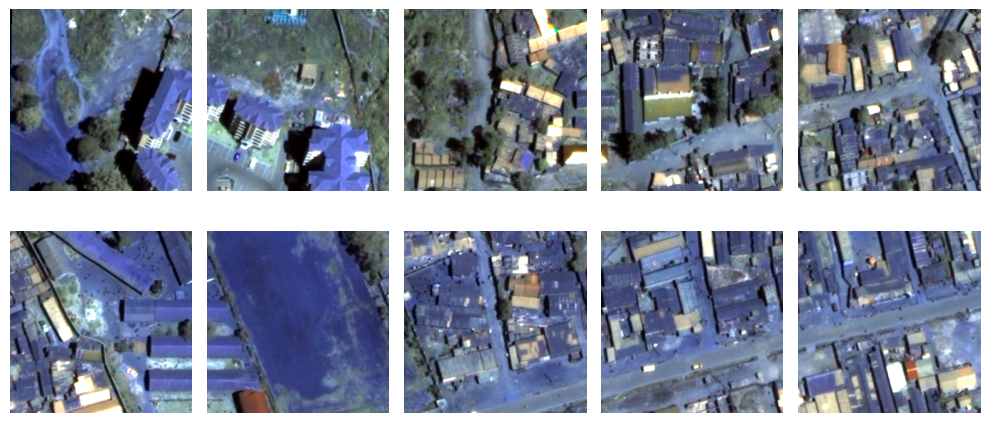

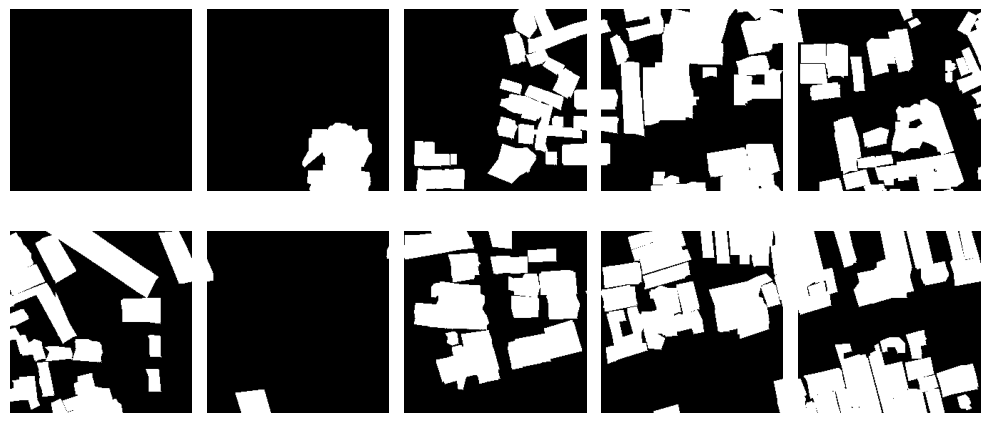

mak


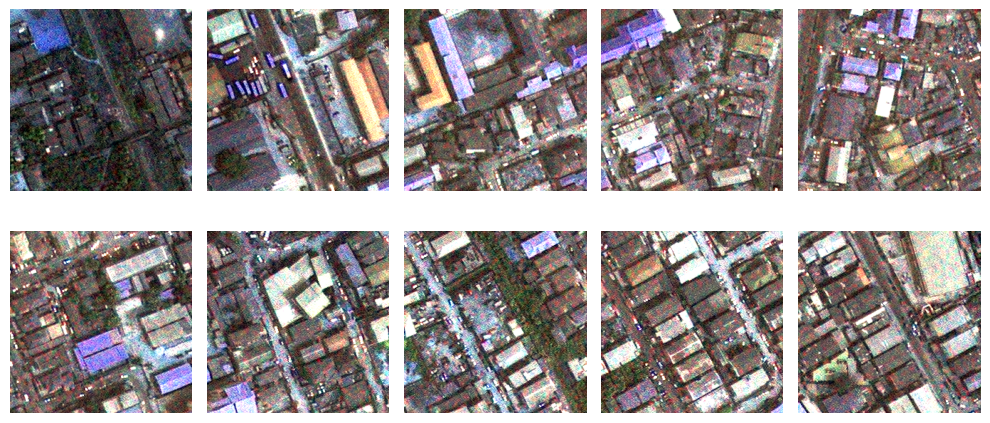

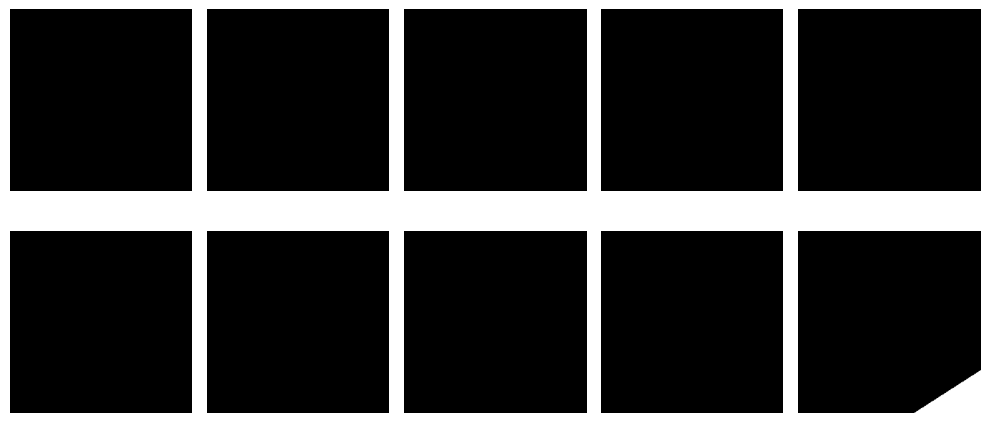

med


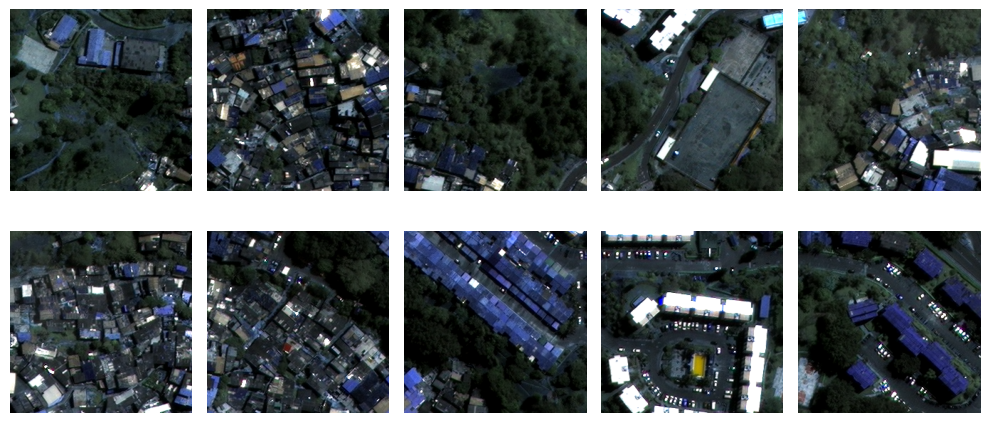

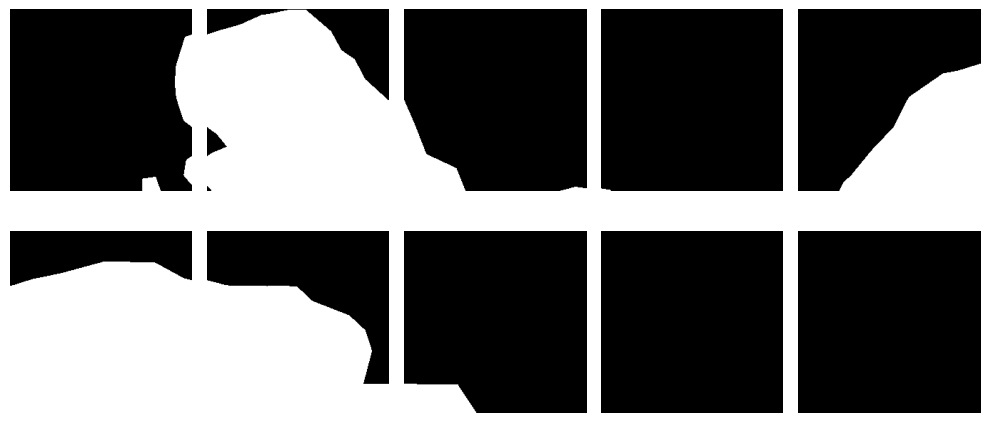

In [14]:
num_rows = 2
num_cols = 5
figdim_a = 10
figdim_b = 5

# View tiles
for suffix in suffixes:
    tiles = globals().get(f'tiles_{suffix}')
    labels = globals().get(f'labels_{suffix}')
    print(suffix)
    visualize_tiles_and_labels(tiles, labels, num_rows, num_cols, figdim_a, figdim_b)

# Call the function for KENYA - KIBERA
#visualize_tiles_and_labels(tiles_kib, labels_kib, num_rows, num_cols, figdim_a, figdim_b)
#visualize_tiles_and_labels(tiles_mak, labels_mak, num_rows, num_cols, figdim_a, figdim_b)
#visualize_tiles_and_labels(tiles_med, labels_med, num_rows, num_cols, figdim_a, figdim_b)

In [15]:
def visualize_random_tiles_and_labels(tiles, labels, num_samples):
    random_indices = random.sample(range(len(tiles)), num_samples)

    for i in random_indices:
        tile = tiles[i]
        label = labels[i]

        # Create a figure and axis objects for plotting
        fig, axes = plt.subplots(1, 2, figsize=(4, 2))  # Adjust the figsize as needed

        # Display the tile
        axes[0].imshow(tile)
        axes[0].axis('off')
        axes[0].set_title('Tile')

        # Display the label tile
        axes[1].imshow(label, cmap='gray')
        axes[1].axis('off')
        axes[1].set_title('Label Tile')

        # Adjust the layout and spacing of the subplots
        plt.tight_layout()

        # Show the plot
        plt.show()

kib


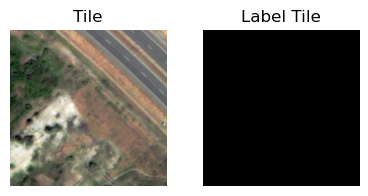

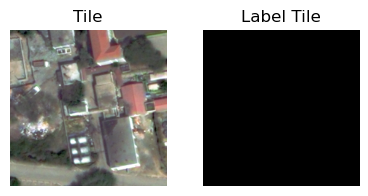

kib_l


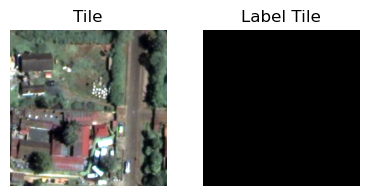

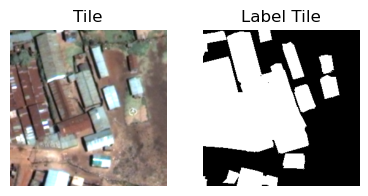

mak


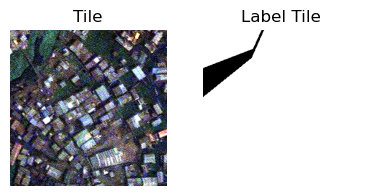

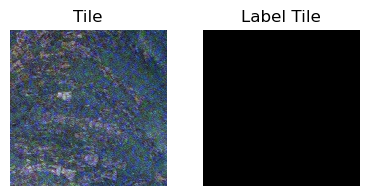

med


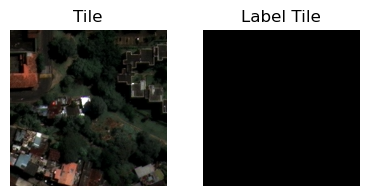

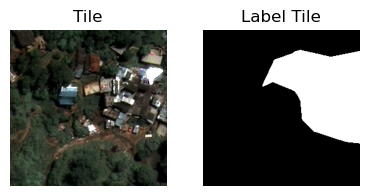

In [16]:
# View tiles (random selection)

num_samples = 2

for suffix in suffixes:
    tiles = globals().get(f'tiles_{suffix}')
    labels = globals().get(f'labels_{suffix}')
    print(suffix)
    visualize_random_tiles_and_labels(tiles, labels, num_samples)

#visualize_random_tiles_and_labels(tiles_kib, labels_kib, num_samples)
#visualize_random_tiles_and_labels(tiles_mak, labels_mak, num_samples)
#visualize_random_tiles_and_labels(tiles_med, labels_med, num_samples)


# Test-Valid-Train Split

We split the tiles and labels into a train and validation set to generate the models. The test set is for out-of sample testing within the same informal settlement. If we want to compare the performance of a model trained on another informal settlement, we should also test it on the same test set (even though the entire other settlement's tiles would be out of sample).

In [17]:
def split_data(tiles, labels, test_size=0.2, valid_size=0.2, random_state=None):
    # Shuffle the tiles and labels together while maintaining their correspondence
    tiles_labels = list(zip(tiles, labels))
    np.random.shuffle(tiles_labels)
    tiles, labels = zip(*tiles_labels)

    # Split the shuffled tiles and labels into train, validation, and test sets
    train_tiles, rem_tiles, train_labels, rem_labels = train_test_split(tiles, labels, test_size=(valid_size + test_size), random_state=random_state)
    valid_tiles, test_tiles, valid_labels, test_labels = train_test_split(rem_tiles, rem_labels, test_size=(test_size / (valid_size + test_size)), random_state=random_state)

    return train_tiles, valid_tiles, test_tiles, train_labels, valid_labels, test_labels


In [18]:
#train_tiles, valid_tiles, test_tiles, train_labels, valid_labels, test_labels = split_data(tiles, labels, test_size=0.2, valid_size=0.2, random_state=42)

split_size = 0.3 # slightly higher as the training set will be enlarged through albumentations
random_state = 42

train_tiles_kib, valid_tiles_kib, test_tiles_kib, train_labels_kib, valid_labels_kib, test_labels_kib = split_data(tiles_kib, labels_kib, test_size= split_size, valid_size=split_size, random_state=random_state)
train_tiles_kib_l, valid_tiles_kib_l, test_tiles_kib_l, train_labels_kib_l, valid_labels_kib_l, test_labels_kib_l = split_data(tiles_kib_l, labels_kib_l, test_size=split_size, valid_size=split_size, random_state=random_state)
train_tiles_mak, valid_tiles_mak, test_tiles_mak, train_labels_mak, valid_labels_mak, test_labels_mak = split_data(tiles_mak, labels_mak, test_size=split_size, valid_size=split_size, random_state=random_state)
train_tiles_med, valid_tiles_med, test_tiles_med, train_labels_med, valid_labels_med, test_labels_med = split_data(tiles_med, labels_med, test_size=split_size, valid_size=split_size, random_state=random_state)


for suffix in suffixes:
    train_tiles = globals().get(f'train_tiles_{suffix}')
    train_labels = globals().get(f'train_labels_{suffix}')
    valid_tiles = globals().get(f'valid_tiles_{suffix}')
    valid_labels = globals().get(f'valid_labels_{suffix}')
    test_tiles = globals().get(f'test_tiles_{suffix}')
    test_labels = globals().get(f'test_labels_{suffix}')
    
    print(suffix)
    print("Train set size - tiles & labels:", len(train_tiles), len(train_labels))
    print("Validation set size - tiles & labels:", len(valid_tiles), len(valid_labels))
    print("Test set size - tiles & labels:", len(test_tiles), len(test_labels))


kib
Train set size - tiles & labels: 540 540
Validation set size - tiles & labels: 405 405
Test set size - tiles & labels: 405 405
kib_l
Train set size - tiles & labels: 175 175
Validation set size - tiles & labels: 131 131
Test set size - tiles & labels: 132 132
mak
Train set size - tiles & labels: 100 100
Validation set size - tiles & labels: 76 76
Test set size - tiles & labels: 76 76
med
Train set size - tiles & labels: 56 56
Validation set size - tiles & labels: 42 42
Test set size - tiles & labels: 42 42


In [19]:
def calculate_label_fractions(labels_1, labels_2, labels_3):
    labels_1 = np.array(labels_1)
    labels_2 = np.array(labels_2)
    labels_3 = np.array(labels_3)

    total_pixels_1 = labels_1.size
    total_pixels_2 = labels_2.size
    total_pixels_3 = labels_3.size

    fraction_1 = np.sum(labels_1) / total_pixels_1
    fraction_2 = np.sum(labels_2) / total_pixels_2
    fraction_3 = np.sum(labels_3) / total_pixels_3

    return fraction_1, fraction_2, fraction_3


# Calculate fractions of 1s for all labels
target_in_train_kib, target_in_valid_kib, target_in_test_kib = calculate_label_fractions(train_labels_kib, valid_labels_kib, test_labels_kib)
target_in_train_kib_l, target_in_valid_kib_l, target_in_test_kib_l = calculate_label_fractions(train_labels_kib_l, valid_labels_kib_l, test_labels_kib_l)
target_in_train_mak, target_in_valid_mak, target_in_test_mak = calculate_label_fractions(train_labels_mak, valid_labels_mak, test_labels_mak)
target_in_train_med, target_in_valid_med, target_in_test_med = calculate_label_fractions(train_labels_med, valid_labels_med, test_labels_med)


for suffix in suffixes:
    target_in_train = globals().get(f'target_in_train_{suffix}')
    target_in_valid = globals().get(f'target_in_valid_{suffix}')
    target_in_test = globals().get(f'target_in_test_{suffix}')

    print(suffix)
    print("Share of slum pixels in train:", round(target_in_train*100,1), '%')
    print("Share of slum pixels in valid:", round(target_in_valid*100,1), '%')
    print("Share of slum pixels in test:", round(target_in_test*100,1), '%')

#length = np.array(train_labels_med).size
#total = np.sum(train_labels_med)
#print(total, length)
#total/length

kib
Share of slum pixels in train: 34.3 %
Share of slum pixels in valid: 36.5 %
Share of slum pixels in test: 36.6 %
kib_l
Share of slum pixels in train: 12.5 %
Share of slum pixels in valid: 15.6 %
Share of slum pixels in test: 13.1 %
mak
Share of slum pixels in train: 35.1 %
Share of slum pixels in valid: 32.6 %
Share of slum pixels in test: 35.4 %
med
Share of slum pixels in train: 44.3 %
Share of slum pixels in valid: 42.3 %
Share of slum pixels in test: 39.6 %


__________________________________________________________________
TRAIN (kib)


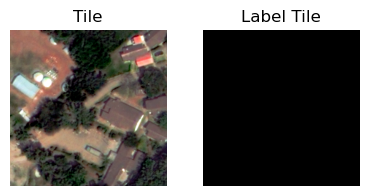

VALID (kib)


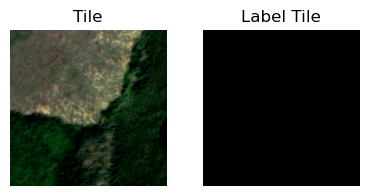

TEST (kib)


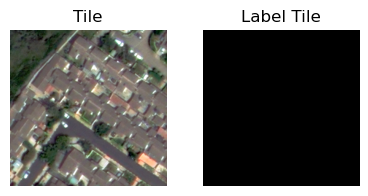

__________________________________________________________________
TRAIN (kib_l)


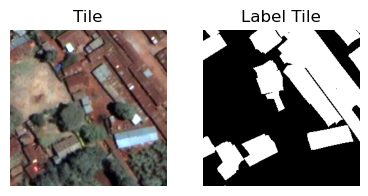

VALID (kib_l)


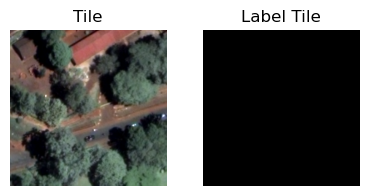

TEST (kib_l)


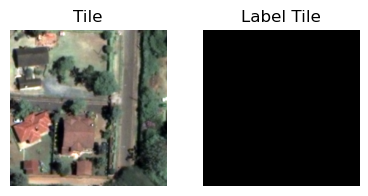

__________________________________________________________________
TRAIN (mak)


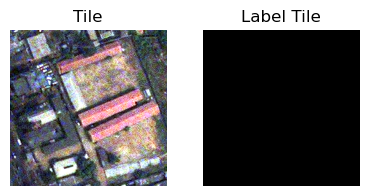

VALID (mak)


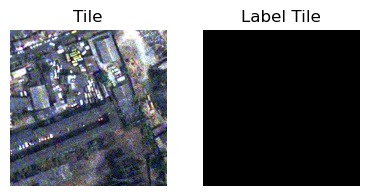

TEST (mak)


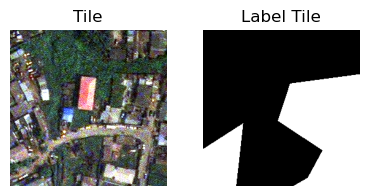

__________________________________________________________________
TRAIN (med)


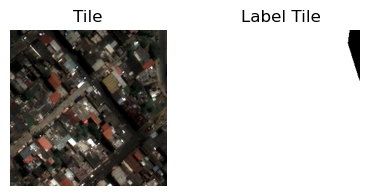

VALID (med)


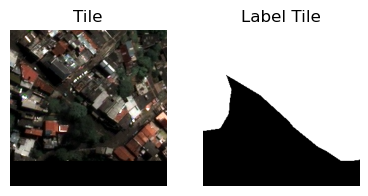

TEST (med)


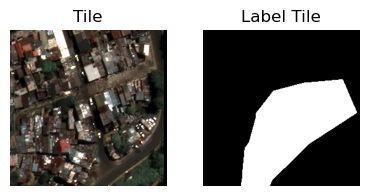

In [20]:
num_samples = 1

for suffix in suffixes:
    train_tiles = globals().get(f'train_tiles_{suffix}')
    train_labels = globals().get(f'train_labels_{suffix}')
    valid_tiles = globals().get(f'valid_tiles_{suffix}')
    valid_labels = globals().get(f'valid_labels_{suffix}')
    test_tiles = globals().get(f'test_tiles_{suffix}')
    test_labels = globals().get(f'test_labels_{suffix}')
    
    print('__________________________________________________________________')
    print('TRAIN', f'({suffix})')
    visualize_random_tiles_and_labels(train_tiles, train_labels, num_samples)
    print('VALID', f'({suffix})')
    visualize_random_tiles_and_labels(valid_tiles, valid_labels, num_samples)
    print('TEST', f'({suffix})')
    visualize_random_tiles_and_labels(test_tiles, test_labels, num_samples)


# Albumentations
Due to the original image being reasonably balanced beteween the target (white, i.e. informal settlement) and the rest of the image, we refrain from under or oversampling.
However, we do use albumentations.

In [21]:
import albumentations as A

def apply_augmentation(tiles, labels):
    # Define the augmentation transformation
    transform = A.Compose([
        A.RandomResizedCrop(256, 256),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5)
    ])

    augmented_tiles = []
    augmented_labels = []

    # Apply augmentation to each tile and update the labels accordingly
    for i in range(len(tiles)):
        tile = tiles[i]
        label = labels[i]

        augmented = transform(image=tile, mask=label)
        augmented_tile = augmented['image']
        augmented_label = augmented['mask']

        augmented_tiles.append(augmented_tile)
        augmented_labels.append(augmented_label)

    # Concatenate the original and augmented tiles and labels
    augmented_tiles = np.concatenate((tiles, augmented_tiles), axis=0)
    augmented_labels = np.concatenate((labels, augmented_labels), axis=0)

    return augmented_tiles, augmented_labels


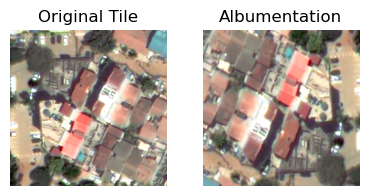

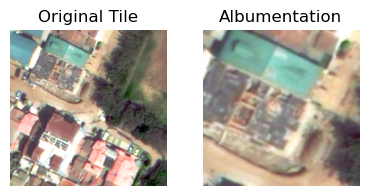

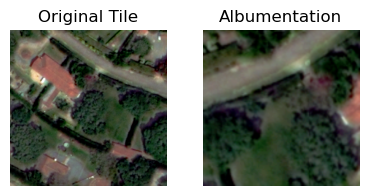

In [22]:
# Vislualise what the albumentations do
transform = A.Compose([
    A.RandomResizedCrop(256, 256),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5)])

tiles = tiles_kib # choose a settlement for illustration
images= [1,2,6]

for i in images: 
    tile = tiles[i]
    trans_image = transform(image=tiles[i])['image']

    # Create a figure and axis objects for plotting
    fig, axes = plt.subplots(1, 2, figsize=(4, 2))  # Adjust the figsize as needed

    # Display the orginial tile
    axes[0].imshow(tile)
    axes[0].axis('off')
    axes[0].set_title('Original Tile')

    # Display the transformed tile
    axes[1].imshow(trans_image)
    axes[1].axis('off')
    axes[1].set_title('Albumentation')

    # plot
    plt.tight_layout()
    plt.show()


In [23]:
# Apply augmentation to the training set
#augmented_train_tiles, augmented_train_labels = apply_augmentation(train_tiles, train_labels)

augmented_train_tiles_kib, augmented_train_labels_kib = apply_augmentation(train_tiles_kib, train_labels_kib)
augmented_train_tiles_kib_l, augmented_train_labels_kib_l = apply_augmentation(train_tiles_kib_l, train_labels_kib_l)
augmented_train_tiles_mak, augmented_train_labels_mak = apply_augmentation(train_tiles_mak, train_labels_mak)
augmented_train_tiles_med, augmented_train_labels_med = apply_augmentation(train_tiles_med, train_labels_med)

# not needed anymore as done within albumentations function (#### DANGER - even running just this one kills the notebook for me...)

#combined_train_tiles = np.concatenate((train_tiles, augmented_train_tiles), axis=0)
#combined_train_labels = np.concatenate((train_labels, augmented_train_labels), axis=0)
#combined_train_tiles_kib = np.concatenate((train_tiles_kib, augmented_train_tiles_kib), axis=0)
#combined_train_labels_kib = np.concatenate((train_labels_kib, augmented_train_labels_kib), axis=0)
#combined_train_tiles_kib_l = np.concatenate((train_tiles_kib_l, augmented_train_tiles_kib_l), axis=0)
#combined_train_labels_kib_l = np.concatenate((train_labels_kib_l, augmented_train_labels_kib_l), axis=0)
#combined_train_tiles_mak = np.concatenate((train_tiles_mak, augmented_train_tiles_mak), axis=0)
#combined_train_labels_mak = np.concatenate((train_labels_mak, augmented_train_labels_mak), axis=0)
#combined_train_tiles_med = np.concatenate((train_tiles_med, augmented_train_tiles_med), axis=0)
#combined_train_labels_med = np.concatenate((train_labels_med, augmented_train_labels_med), axis=0)


In [24]:
for suffix in suffixes:
    train_tiles = globals().get(f'train_tiles_{suffix}')
    train_labels = globals().get(f'train_labels_{suffix}')
    #alb_train_tiles =  globals().get(f'combined_train_tiles_{suffix}')
    #alb_train_labels =  globals().get(f'combined_train_labels_{suffix}')
    alb_train_tiles =  globals().get(f'augmented_train_tiles_{suffix}')
    alb_train_labels =  globals().get(f'augmented_train_labels_{suffix}')
    
    valid_tiles = globals().get(f'valid_tiles_{suffix}')
    valid_labels = globals().get(f'valid_labels_{suffix}')
    test_tiles = globals().get(f'test_tiles_{suffix}')
    test_labels = globals().get(f'test_labels_{suffix}')
    
    print(suffix)
    print("Train set size (pre-albumentation) - tiles & labels:", len(train_tiles), len(train_labels))
    print("Train set size (post-albumentation) - tiles & labels:", len(alb_train_tiles), len(alb_train_labels))
    print("Validation set size - tiles & labels:", len(valid_tiles), len(valid_labels))
    print("Test set size - tiles & labels:", len(test_tiles), len(test_labels))

kib
Train set size (pre-albumentation) - tiles & labels: 540 540
Train set size (post-albumentation) - tiles & labels: 1080 1080
Validation set size - tiles & labels: 405 405
Test set size - tiles & labels: 405 405
kib_l
Train set size (pre-albumentation) - tiles & labels: 175 175
Train set size (post-albumentation) - tiles & labels: 350 350
Validation set size - tiles & labels: 131 131
Test set size - tiles & labels: 132 132
mak
Train set size (pre-albumentation) - tiles & labels: 100 100
Train set size (post-albumentation) - tiles & labels: 200 200
Validation set size - tiles & labels: 76 76
Test set size - tiles & labels: 76 76
med
Train set size (pre-albumentation) - tiles & labels: 56 56
Train set size (post-albumentation) - tiles & labels: 112 112
Validation set size - tiles & labels: 42 42
Test set size - tiles & labels: 42 42


# Slum detection in Lower Nairobi

## Generate Tensors and Datasets

In [4]:
def custom_collate_fn(batch):
    # Extract the tiles and labels from the batch
    tiles, labels = zip(*batch)

    # Reshape the tiles to (batch_size, channels, height, width) #batch_tiles = batch_tiles.permute(0, 3, 1, 2)
    tiles = torch.stack(tiles).permute(0, 3, 1, 2)

    # Return the reshaped tiles and labels as a tuple
    return tiles, torch.stack(labels)

In [5]:
batch_size=32

In [30]:
# Generating tensors - takes time to run!

# kib_l
train_tiles_tensor_kib_l = torch.Tensor(augmented_train_tiles_kib_l)
train_labels_tensor_kib_l = torch.Tensor(augmented_train_labels_kib_l)

valid_tiles_tensor_kib_l = torch.Tensor(valid_tiles_kib_l)
valid_labels_tensor_kib_l = torch.Tensor(valid_labels_kib_l)

test_tiles_tensor_kib_l = torch.Tensor(test_tiles_kib_l)
test_labels_tensor_kib_l = torch.Tensor(test_labels_kib_l)



/tmp/ipykernel_32/1571219257.py:7: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:245.)
  valid_tiles_tensor_kib_l = torch.Tensor(valid_tiles_kib_l)


In [31]:
# Generating Datasets - runs fast

train_data_kib_l = TensorDataset(train_tiles_tensor_kib_l, train_labels_tensor_kib_l)
valid_data_kib_l = TensorDataset(valid_tiles_tensor_kib_l, valid_labels_tensor_kib_l)
test_data_kib_l = TensorDataset(test_tiles_tensor_kib_l, test_labels_tensor_kib_l) # not used yet, but already generated



In [32]:
# Load the Tensor Datasets - runs fast

train_dataloader_kib_l = DataLoader(train_data_kib_l, batch_size=batch_size, collate_fn=custom_collate_fn, shuffle=True)
valid_dataloader_kib_l = DataLoader(valid_data_kib_l, batch_size=batch_size, collate_fn=custom_collate_fn, shuffle=True)
test_dataloader_kib_l = DataLoader(test_data_kib_l, batch_size=batch_size, collate_fn=custom_collate_fn, shuffle=True)

# Let's save the test set, as we'll need it later to do across-slum predictions
with open('/kaggle/working/test_dataloader_kib_l.pkl', 'wb') as file:
    pickle.dump(test_dataloader_kib_l, file)

In [31]:
#train_tiles_tensor = torch.Tensor(augmented_train_tiles)
#train_labels_tensor_kib = torch.Tensor(augmented_train_labels)

#valid_tiles_tensor = torch.Tensor(valid_tiles)
#valid_labels_tensor = torch.Tensor(valid_labels)

# not used yet, but already generated
#test_tiles_tensor = torch.Tensor(test_tiles)
#test_labels_tensor_kib = torch.Tensor(test_labels)

#train_data = TensorDataset(train_tiles_tensor, train_labels_tensor)
#valid_data = TensorDataset(valid_tiles_tensor, valid_labels_tensor)

#train_dataloader = DataLoader(train_data, batch_size=batch_size, collate_fn=custom_collate_fn, shuffle=True)
#train_dataloader_wthout = DataLoader(train_data, batch_size=batch_size, shuffle=True)

#valid_dataloader = DataLoader(valid_data, batch_size=batch_size, collate_fn=custom_collate_fn, shuffle=True)
#test_dataloader = DataLoader(test_data, batch_size=batch_size, collate_fn=custom_collate_fn, shuffle=True)

# Model creation

Note:
- The expected input shape for a TensorFlow model is (batch_size, height, width, channels).
- The expected input shape for a PyTorch model is (batch_size, channels, height, width)

In [6]:
device = 'cuda' 

In [11]:
# Use evaluation class from homework labs 

class EvalTracker:
    def __init__(self, n_classes=2, smooth=0.0001):
        self.n_classes = n_classes
        self.reset()
        self.smooth = smooth

    def reset(self):
        self.cm = np.zeros((self.n_classes, self.n_classes))
        self.count = 0
    
    def update(self, pred, target):
        # pred: [B, 2, H, W]
        # target: [B, H, W]
        self.count += pred.shape[0]

        # reshape inputs
        pred = pred.argmax(dim=1).flatten()  # [B*H*W]
        target = target.flatten()  # [B*H*W]

        # put into cpu memory
        pred = pred.detach().cpu().numpy()
        target = target.detach().cpu().numpy()

        # compute confusion matrix values
        self.cm += confusion_matrix(target, pred)

    def get_mean(self):
        tn, fp, fn, tp = self.cm.ravel()

        # compute IoU
        iou = tp / (tp + fp + fn + self.smooth)
        prec = tp / (tp + fp + self.smooth)
        rec = tp / (tp + fn + self.smooth)
        f1 = 2.0*prec*rec/(prec+rec)

        return iou, prec, rec, f1

In [10]:
def create_model():

    model = smp.Unet(
    encoder_name = 'resnet34',
    encoder_weights = None,         # use `imagenet` pre-trained weights for encoder initialization
    in_channels=3,                  # model input channels (1 for gray-scale images, 3 for RGB, etc.)
    classes=2)                      # model output channels (number of classes in your dataset)
    
    return model

In [30]:
learning_rate = 1e-4
epochs = 15
criteria_no_weights = nn.CrossEntropyLoss(weight=None)


In [36]:
# create models and load them into GPU memory

model_kib_l = create_model()
model_kib_l.to(device) 
optimizer = torch.optim.Adam(model_kib_l.parameters(), lr=learning_rate)


In [37]:
# kib_l
train_loss_dict={}
val_loss_dict={}

for epoch in range(epochs):
    print('Epoch: [{}/{}]'.format(epoch+1, epochs))

    # TRAINING SET
    
    pbar = tqdm(train_dataloader_kib_l)
    train_loss = 0.0
    model_kib_l.train()
    eval_logger = EvalTracker()
    
    for batch_tile, batch_label  in pbar:
        
        # load image and mask into device memory
        image = batch_tile.to(device) #batch['image'].to(device)
        mask =  batch_label.to(device) #batch['mask'].to(device)

        # pass images into model
        pred = model_kib_l(image)

        # get loss
        loss = criteria_no_weights(pred, mask.to(torch.long)) # mask was previously float so now converted to long (integer equivalent)

        # update the model
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
               
        # compute and display progress
        eval_logger.update(pred, mask)
        mIoU, Prec, Rec, f1 = eval_logger.get_mean()
        pbar.set_description('Loss: {0:1.4f} | mIoU {1:1.4f} | Prec {2:1.4f} | Rec {3:1.4f}  | F1 score {4:1.4f}'.format(loss.item(), mIoU, Prec, Rec, f1))
        train_loss += loss.item() * image.size(0)
    
    # calculate the average loss for training
    train_loss /= len(train_dataloader_kib_l.dataset)
    train_loss_dict[epoch] = train_loss
    
    
    # VALIDATION set
    
    pbar = tqdm(valid_dataloader_kib_l)
    model_kib_l.eval()
    eval_logger = EvalTracker()
    val_loss = 0.0
    with torch.no_grad():
        for batch in pbar:
            # load image and mask into device memory
            image = batch_tile.to(device) #batch['image'].to(device)
            mask =  batch_label.to(device) #batch['mask'].to(device)

            # pass images into model
            pred = model_kib_l(image)

            # get loss
            loss = criteria_no_weights(pred, mask.to(torch.long))
                       
            # compute and display progress
            eval_logger.update(pred, mask)
            mIoU, Prec, Rec, f1 = eval_logger.get_mean()
            pbar.set_description('Loss: {0:1.4f} | mIoU {1:1.4f} | Prec {2:1.4f} | Rec {3:1.4f}  | F1 score {4:1.4f}'.format(loss.item(), mIoU, Prec, Rec, f1))
            val_loss += loss.item() * image.size(0)
    
    # calculate the average loss for validation
    val_loss /= len(valid_dataloader_kib_l.dataset)
    val_loss_dict[epoch] = val_loss
    
# Save the training loss values
with open('./train_loss_kib_l.pkl', 'wb') as file:
    pickle.dump(train_loss_dict, file)
     
# Save the validation loss values
with open('./val_loss_kib_l.pkl', 'wb') as file:
    pickle.dump(val_loss_dict, file)            
# save model
torch.save(model_kib_l.state_dict(), 'model_kib_l.pt')


Epoch: [1/15]


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: [2/15]


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: [3/15]


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: [4/15]


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: [5/15]


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: [6/15]


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: [7/15]


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: [8/15]


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: [9/15]


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: [10/15]


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: [11/15]


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: [12/15]


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: [13/15]


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: [14/15]


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: [15/15]


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

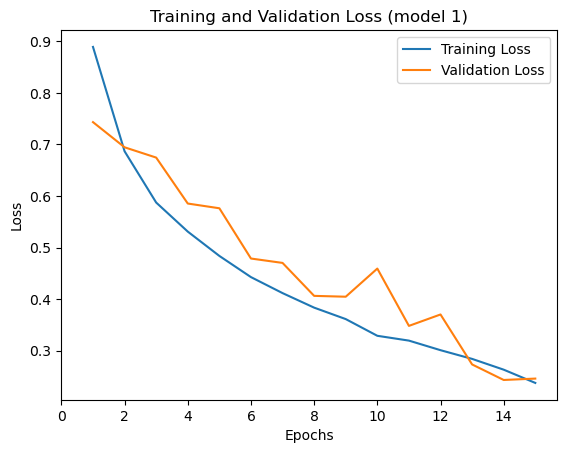

In [38]:
# Load the training and validation loss dictionaries
train_loss = load(open('/kaggle/working/train_loss_kib_l.pkl', 'rb'))
val_loss = load(open('/kaggle/working/val_loss_kib_l.pkl', 'rb'))
 
# Retrieve each dictionary's values
train_values = train_loss.values()
val_values = val_loss.values()
 
# Generate a sequence of integers to represent the epoch numbers
epochs_range = range(1, epochs+1)
 
# Plot and label the training and validation loss values
plt.plot(epochs_range, train_values, label='Training Loss')
plt.plot(epochs_range, val_values, label='Validation Loss')
 
# Add in a title and axes labels
plt.title('Training and Validation Loss (model 1)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
 
# Set the tick locations
plt.xticks(np.arange(0, epochs+1, 2))
 
# Display the plot
plt.legend(loc='best')
plt.show()

## Out-of-sample metrics for within-slum predictions in Lower Nairobi:

In [11]:
 # This was done at a later stage, so we uploaded the model and are now calling it from the input file

model_kib_l = create_model()
model_kib_l.to(device)
model_kib_l.load_state_dict(torch.load('/kaggle/input/model-kib-l/model_kib_l.pt'))
model_kib_l.eval()


Unet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track

In [13]:
# Load the test set
with open('/kaggle/input/test-dataloader-kib-l/test_dataloader_kib_l.pkl', 'rb') as file:
    test_dataloader_kib_l = pickle.load(file)


In [20]:
predictions_kib_l = []
eval_logger = EvalTracker()
with torch.no_grad():
    for batch_tile, batch_label in tqdm(test_dataloader_kib_l):
        # Load image and mask into device memory
        image = batch_tile.to(device)
        mask = batch_label.to(device)

        # Pass images into the model
        pred = model_kib_l(image)

        # Update evaluation tracker
        eval_logger.update(pred, mask)
        
        # compute class predictions, i.e. slum or no slum
        class_pred = pred.argmax(dim=1)
        # convert class prediction to numpy
        class_pred = class_pred.detach().cpu().numpy()
        predictions_kib_l.append(class_pred.astype('uint8'))

predictions_kib_l_all = np.concatenate(predictions_kib_l, axis=0)
# Get the evaluation metrics
mIoU, Prec, Rec, f1 = eval_logger.get_mean()
print("Test Results - mIoU: {:.4f} | Precision: {:.4f} | Recall: {:.4f} | F1 Score: {:.4f}".format(mIoU, Prec, Rec, f1))




  0%|          | 0/5 [00:00<?, ?it/s]

Test Results - mIoU: 0.4773 | Precision: 0.8524 | Recall: 0.5203 | F1 Score: 0.6462


Let's print some random tiles to check the predictions!

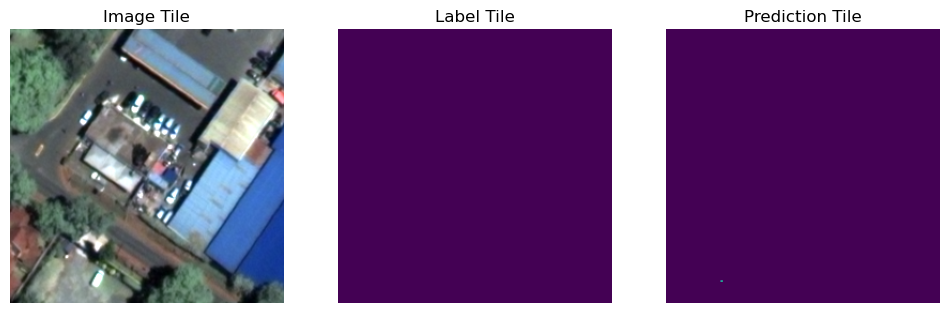

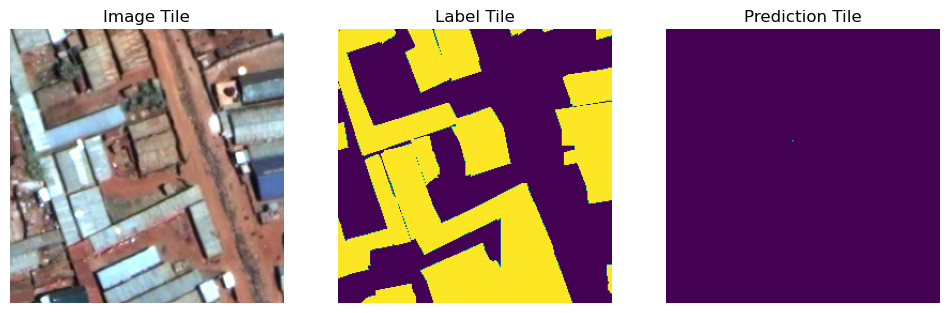

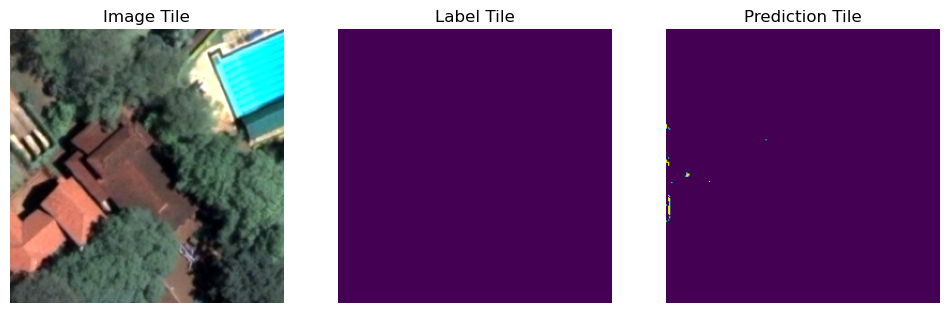

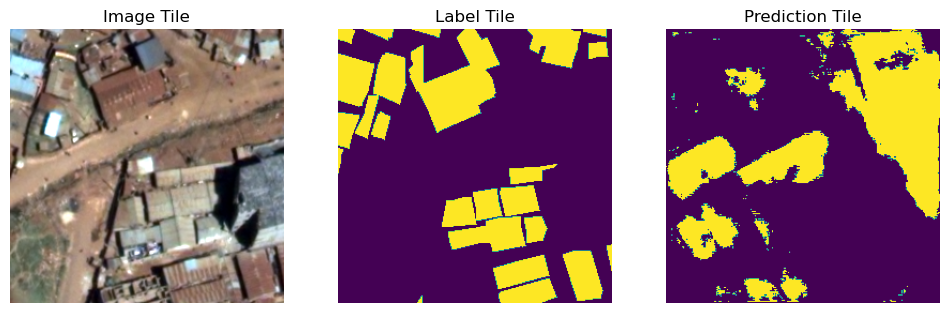

In [27]:
# Select 4 random indices
random_indices = random.sample(range(len(test_dataloader_kib_l.dataset)), 4)

# Iterate over the random indices and display the image, label, and prediction tiles
for index in random_indices:
    # Get the image, label, and prediction tiles for visualization
    sample = test_dataloader_kib_l.dataset[index]
    image_tile = sample[0].numpy()
    label_tile = sample[1].numpy()
    prediction_tile = predictions_kib_l_all[index]

    # Display the image, label, and prediction tiles using matplotlib
    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    axs[0].imshow(image_tile)
    axs[0].set_title('Image Tile')
    axs[0].axis('off')
    axs[1].imshow(label_tile)
    axs[1].set_title('Label Tile')
    axs[1].axis('off')
    axs[2].imshow(prediction_tile)
    axs[2].set_title('Prediction Tile')
    axs[2].axis('off')

    plt.show()


# Slum predictions in Kibera

In [27]:
train_tiles_tensor_kib = torch.Tensor(augmented_train_tiles_kib)
train_labels_tensor_kib = torch.Tensor(augmented_train_labels_kib)

valid_tiles_tensor_kib = torch.Tensor(valid_tiles_kib)
valid_labels_tensor_kib = torch.Tensor(valid_labels_kib)

test_tiles_tensor_kib = torch.Tensor(test_tiles_kib)
test_labels_tensor_kib = torch.Tensor(test_labels_kib)

train_data_kib = TensorDataset(train_tiles_tensor_kib, train_labels_tensor_kib)
valid_data_kib = TensorDataset(valid_tiles_tensor_kib, valid_labels_tensor_kib)
test_data_kib = TensorDataset(test_tiles_tensor_kib, test_labels_tensor_kib) # not used yet, but already generated

train_dataloader_kib = DataLoader(train_data_kib, batch_size=batch_size, collate_fn=custom_collate_fn, shuffle=True)
valid_dataloader_kib = DataLoader(valid_data_kib, batch_size=batch_size, collate_fn=custom_collate_fn, shuffle=True)
test_dataloader_kib = DataLoader(test_data_kib, batch_size=batch_size, collate_fn=custom_collate_fn, shuffle=True)

# Let's save the test set, as we'll need it later to do across-slum predictions
with open('/kaggle/working/test_dataloader_kib.pkl', 'wb') as file:
    pickle.dump(test_dataloader_kib, file)
    
# Kaggle keeps crashing due to memory issues, so I'll save also train and eval, re-start the session and start again from here
with open('/kaggle/working/train_dataloader_kib.pkl', 'wb') as file:
    pickle.dump(train_dataloader_kib, file)
    
with open('/kaggle/working/valid_dataloader_kib.pkl', 'wb') as file:
    pickle.dump(valid_dataloader_kib, file)
    


/tmp/ipykernel_28/2608652848.py:4: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /usr/local/src/pytorch/torch/csrc/utils/tensor_new.cpp:245.)
  valid_tiles_tensor_kib = torch.Tensor(valid_tiles_kib)


In [10]:
# Load train dataloader
with open('/kaggle/input/kib-split/train_dataloader_kib.pkl', 'rb') as file:
    train_dataloader_kib = pickle.load(file)

# Load validation dataloader
with open('/kaggle/input/kib-split/valid_dataloader_kib.pkl', 'rb') as file:
    valid_dataloader_kib = pickle.load(file)


### Model creation

In [11]:
model_kib = create_model()
model_kib.to(device) 
optimizer = torch.optim.Adam(model_kib.parameters(), lr=learning_rate)

In [12]:
# kib
train_loss_dict={}
val_loss_dict={}

for epoch in range(epochs):
    print('Epoch: [{}/{}]'.format(epoch+1, epochs))

    # TRAINING SET
    
    pbar = tqdm(train_dataloader_kib)
    train_loss = 0.0
    model_kib.train()
    eval_logger = EvalTracker()
    
    for batch_tile, batch_label  in pbar:
        
        # load image and mask into device memory
        image = batch_tile.to(device) #batch['image'].to(device)
        mask =  batch_label.to(device) #batch['mask'].to(device)

        # pass images into model
        pred = model_kib(image)

        # get loss
        loss = criteria_no_weights(pred, mask.to(torch.long)) # mask was previously float so now converted to long (integer equivalent)

        # update the model
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
               
        # compute and display progress
        eval_logger.update(pred, mask)
        mIoU, Prec, Rec, f1 = eval_logger.get_mean()
        pbar.set_description('Loss: {0:1.4f} | mIoU {1:1.4f} | Prec {2:1.4f} | Rec {3:1.4f}  | F1 score {4:1.4f}'.format(loss.item(), mIoU, Prec, Rec, f1))
        train_loss += loss.item() * image.size(0)
    
    # calculate the average loss for training
    train_loss /= len(train_dataloader_kib.dataset)
    train_loss_dict[epoch] = train_loss
    
    
    # VALIDATION set
    
    pbar = tqdm(valid_dataloader_kib)
    model_kib.eval()
    eval_logger = EvalTracker()
    val_loss = 0.0
    with torch.no_grad():
        for batch in pbar:
            # load image and mask into device memory
            image = batch_tile.to(device) #batch['image'].to(device)
            mask =  batch_label.to(device) #batch['mask'].to(device)

            # pass images into model
            pred = model_kib(image)

            # get loss
            loss = criteria_no_weights(pred, mask.to(torch.long))
                       
            # compute and display progress
            eval_logger.update(pred, mask)
            mIoU, Prec, Rec, f1 = eval_logger.get_mean()
            pbar.set_description('Loss: {0:1.4f} | mIoU {1:1.4f} | Prec {2:1.4f} | Rec {3:1.4f}  | F1 score {4:1.4f}'.format(loss.item(), mIoU, Prec, Rec, f1))
            val_loss += loss.item() * image.size(0)
    
    # calculate the average loss for validation
    val_loss /= len(valid_dataloader_kib.dataset)
    val_loss_dict[epoch] = val_loss
    
# Save the training loss values
with open('./train_loss_kib.pkl', 'wb') as file:
    pickle.dump(train_loss_dict, file)
     
# Save the validation loss values
with open('./val_loss_kib.pkl', 'wb') as file:
    pickle.dump(val_loss_dict, file)            
# save model
torch.save(model_kib.state_dict(), 'model_kib.pt')

Epoch: [1/15]


  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

Epoch: [2/15]


  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

Epoch: [3/15]


  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

Epoch: [4/15]


  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

Epoch: [5/15]


  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

Epoch: [6/15]


  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

Epoch: [7/15]


  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

Epoch: [8/15]


  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

Epoch: [9/15]


  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

Epoch: [10/15]


  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

Epoch: [11/15]


  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

Epoch: [12/15]


  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

Epoch: [13/15]


  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

Epoch: [14/15]


  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

Epoch: [15/15]


  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

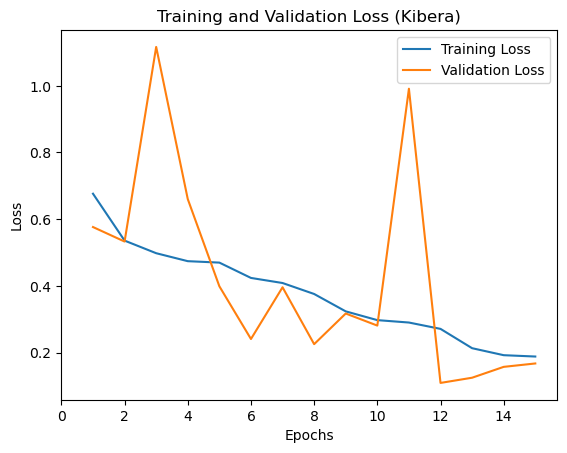

In [14]:
# Load the training and validation loss dictionaries
train_loss = load(open('/kaggle/working/train_loss_kib.pkl', 'rb'))
val_loss = load(open('/kaggle/working/val_loss_kib.pkl', 'rb'))
 
# Retrieve each dictionary's values
train_values = train_loss.values()
val_values = val_loss.values()
 
# Generate a sequence of integers to represent the epoch numbers
epochs_range = range(1, epochs+1)
 
# Plot and label the training and validation loss values
plt.plot(epochs_range, train_values, label='Training Loss')
plt.plot(epochs_range, val_values, label='Validation Loss')
 
# Add in a title and axes labels
plt.title('Training and Validation Loss (Kibera)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
 
# Set the tick locations
plt.xticks(np.arange(0, epochs+1, 2))
 
# Display the plot
plt.legend(loc='best')
plt.show()

## Out-of-sample metrics for within-slum predictions in Kibera:

In [15]:
model_kib = create_model()
model_kib.to(device)
model_kib.load_state_dict(torch.load('/kaggle/working/model_kib.pt'))
model_kib.eval()

Unet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track

In [18]:
# Load the test set
with open('/kaggle/input/kib-split/test_dataloader_kib.pkl', 'rb') as file:
    test_dataloader_kib = pickle.load(file)


In [19]:
predictions_kib = []
eval_logger = EvalTracker()
with torch.no_grad():
    for batch_tile, batch_label in tqdm(test_dataloader_kib):
        # Load image and mask into device memory
        image = batch_tile.to(device)
        mask = batch_label.to(device)

        # Pass images into the model
        pred = model_kib(image)

        # Update evaluation tracker
        eval_logger.update(pred, mask)
        
        # compute class predictions, i.e. slum or no slum
        class_pred = pred.argmax(dim=1)
        # convert class prediction to numpy
        class_pred = class_pred.detach().cpu().numpy()
        predictions_kib.append(class_pred.astype('uint8'))

predictions_kib_all = np.concatenate(predictions_kib, axis=0)
# Get the evaluation metrics
mIoU, Prec, Rec, f1 = eval_logger.get_mean()
print("Test Results - mIoU: {:.4f} | Precision: {:.4f} | Recall: {:.4f} | F1 Score: {:.4f}".format(mIoU, Prec, Rec, f1))



  0%|          | 0/13 [00:00<?, ?it/s]

Test Results - mIoU: 0.4110 | Precision: 0.7256 | Recall: 0.4867 | F1 Score: 0.5826


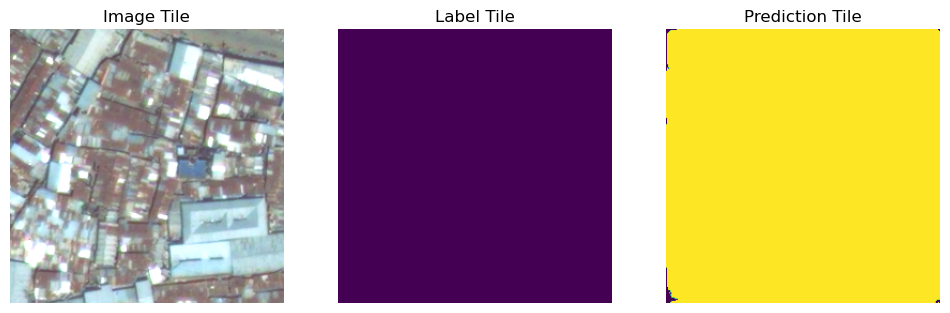

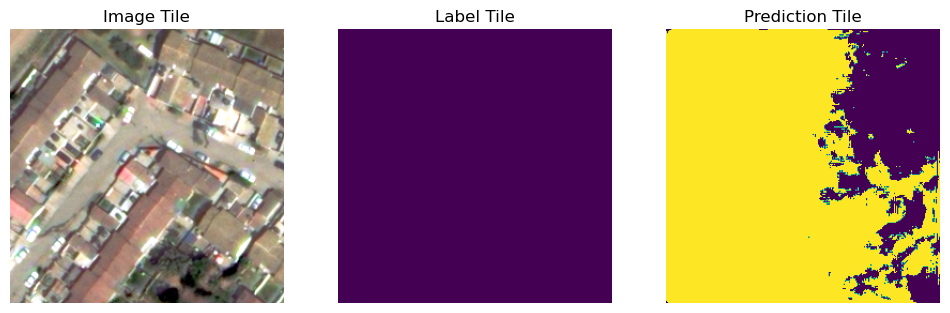

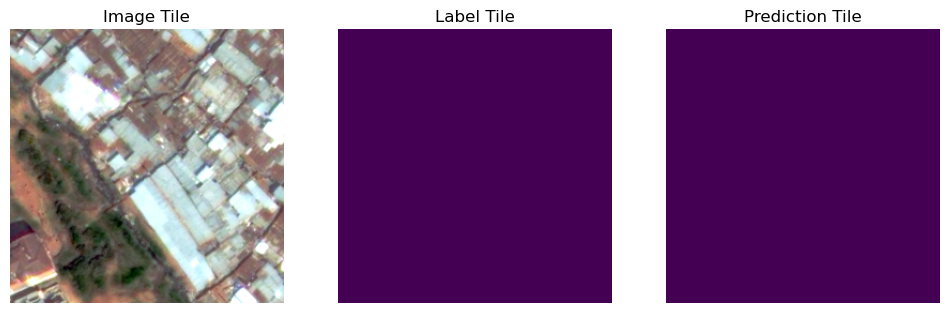

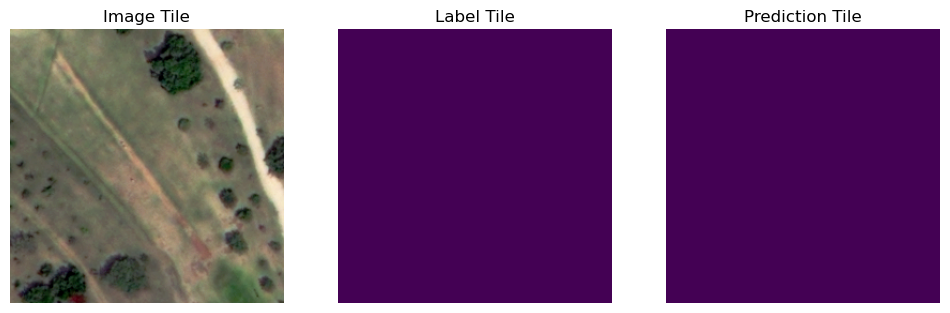

In [24]:
# Select 4 random indices
random_indices = random.sample(range(len(test_dataloader_kib.dataset)), 4)

# Iterate over the random indices and display the image, label, and prediction tiles
for index in random_indices:
    # Get the image, label, and prediction tiles for visualization
    sample = test_dataloader_kib.dataset[index]
    image_tile = sample[0].numpy()
    label_tile = sample[1].numpy()
    prediction_tile = predictions_kib_all[index]

    # Display the image, label, and prediction tiles using matplotlib
    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    axs[0].imshow(image_tile)
    axs[0].set_title('Image Tile')
    axs[0].axis('off')
    axs[1].imshow(label_tile)
    axs[1].set_title('Label Tile')
    axs[1].axis('off')
    axs[2].imshow(prediction_tile)
    axs[2].set_title('Prediction Tile')
    axs[2].axis('off')

    plt.show()

# Slums prediction in Makoko

In [32]:
# mak
train_tiles_tensor_mak = torch.Tensor(augmented_train_tiles_mak)
train_labels_tensor_mak = torch.Tensor(augmented_train_labels_mak)

valid_tiles_tensor_mak = torch.Tensor(valid_tiles_mak)
valid_labels_tensor_mak = torch.Tensor(valid_labels_mak)

test_tiles_tensor_mak = torch.Tensor(test_tiles_mak)
test_labels_tensor_mak = torch.Tensor(test_labels_mak)

train_data_mak = TensorDataset(train_tiles_tensor_mak, train_labels_tensor_mak)
valid_data_mak = TensorDataset(valid_tiles_tensor_mak, valid_labels_tensor_mak)
test_data_mak = TensorDataset(test_tiles_tensor_mak, test_labels_tensor_mak)

train_dataloader_mak = DataLoader(train_data_mak, batch_size=batch_size, collate_fn=custom_collate_fn, shuffle=True)
valid_dataloader_mak = DataLoader(valid_data_mak, batch_size=batch_size, collate_fn=custom_collate_fn, shuffle=True)
test_dataloader_mak = DataLoader(test_data_mak, batch_size=batch_size, collate_fn=custom_collate_fn, shuffle=True)

# Let's save the test set, as we'll need it later to do across-slum predictions
with open('/kaggle/working/test_dataloader_mak.pkl', 'wb') as file:
    pickle.dump(test_dataloader_mak, file)
    
# Kaggle keeps crashing due to memory issues, so I'll save also train and eval, re-start the session and start again from here
with open('/kaggle/working/train_dataloader_mak.pkl', 'wb') as file:
    pickle.dump(train_dataloader_mak, file)
    
with open('/kaggle/working/valid_dataloader_mak.pkl', 'wb') as file:
    pickle.dump(valid_dataloader_mak, file)

## Model creation

In [33]:
model_mak = create_model()
model_mak.to(device) 
optimizer = torch.optim.Adam(model_mak.parameters(), lr=learning_rate)

In [34]:
# mak
train_loss_dict={}
val_loss_dict={}

for epoch in range(epochs):
    print('Epoch: [{}/{}]'.format(epoch+1, epochs))

    # TRAINING SET
    
    pbar = tqdm(train_dataloader_mak)
    train_loss = 0.0
    model_mak.train()
    eval_logger = EvalTracker()
    
    for batch_tile, batch_label  in pbar:
        
        # load image and mask into device memory
        image = batch_tile.to(device) #batch['image'].to(device)
        mask =  batch_label.to(device) #batch['mask'].to(device)

        # pass images into model
        pred = model_mak(image)

        # get loss
        loss = criteria_no_weights(pred, mask.to(torch.long)) # mask was previously float so now converted to long (integer equivalent)

        # update the model
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
               
        # compute and display progress
        eval_logger.update(pred, mask)
        mIoU, Prec, Rec, f1 = eval_logger.get_mean()
        pbar.set_description('Loss: {0:1.4f} | mIoU {1:1.4f} | Prec {2:1.4f} | Rec {3:1.4f}  | F1 score {4:1.4f}'.format(loss.item(), mIoU, Prec, Rec, f1))
        train_loss += loss.item() * image.size(0)
    
    # calculate the average loss for training
    train_loss /= len(train_dataloader_mak.dataset)
    train_loss_dict[epoch] = train_loss
    
    
    # VALIDATION set
    
    pbar = tqdm(valid_dataloader_mak)
    model_mak.eval()
    eval_logger = EvalTracker()
    val_loss = 0.0
    with torch.no_grad():
        for batch in pbar:
            # load image and mask into device memory
            image = batch_tile.to(device) #batch['image'].to(device)
            mask =  batch_label.to(device) #batch['mask'].to(device)

            # pass images into model
            pred = model_mak(image)

            # get loss
            loss = criteria_no_weights(pred, mask.to(torch.long))
                       
            # compute and display progress
            eval_logger.update(pred, mask)
            mIoU, Prec, Rec, f1 = eval_logger.get_mean()
            pbar.set_description('Loss: {0:1.4f} | mIoU {1:1.4f} | Prec {2:1.4f} | Rec {3:1.4f}  | F1 score {4:1.4f}'.format(loss.item(), mIoU, Prec, Rec, f1))
            val_loss += loss.item() * image.size(0)
    
    # calculate the average loss for validation
    val_loss /= len(valid_dataloader_mak.dataset)
    val_loss_dict[epoch] = val_loss
    
# Save the training loss values
with open('./train_loss_mak.pkl', 'wb') as file:
    pickle.dump(train_loss_dict, file)
     
# Save the validation loss values
with open('./val_loss_mak.pkl', 'wb') as file:
    pickle.dump(val_loss_dict, file)            
# save model
torch.save(model_mak.state_dict(), 'model_mak.pt')

Epoch: [1/15]


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: [2/15]


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: [3/15]


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: [4/15]


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: [5/15]


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: [6/15]


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: [7/15]


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: [8/15]


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: [9/15]


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: [10/15]


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: [11/15]


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: [12/15]


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: [13/15]


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: [14/15]


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: [15/15]


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

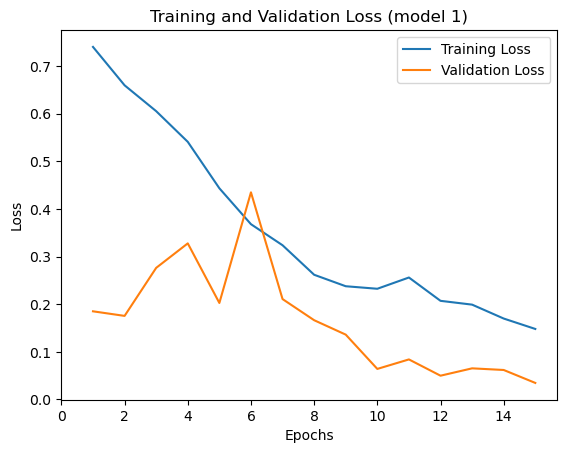

In [35]:
# Load the training and validation loss dictionaries
train_loss = load(open('/kaggle/working/train_loss_mak.pkl', 'rb'))
val_loss = load(open('/kaggle/working/val_loss_mak.pkl', 'rb'))
 
# Retrieve each dictionary's values
train_values = train_loss.values()
val_values = val_loss.values()
 
# Generate a sequence of integers to represent the epoch numbers
epochs_range = range(1, epochs+1)
 
# Plot and label the training and validation loss values
plt.plot(epochs_range, train_values, label='Training Loss')
plt.plot(epochs_range, val_values, label='Validation Loss')
 
# Add in a title and axes labels
plt.title('Training and Validation Loss (model 1)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
 
# Set the tick locations
plt.xticks(np.arange(0, epochs+1, 2))
 
# Display the plot
plt.legend(loc='best')
plt.show()# Delete model from memory

## Out-of-sample metrics for within-slum predictions in Makoko:

In [37]:
model_mak = create_model()
model_mak.to(device)
model_mak.load_state_dict(torch.load('/kaggle/working/model_mak.pt'))
model_mak.eval()


Unet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track

In [38]:
predictions_mak = []
eval_logger = EvalTracker()
with torch.no_grad():
    for batch_tile, batch_label in tqdm(test_dataloader_mak):
        # Load image and mask into device memory
        image = batch_tile.to(device)
        mask = batch_label.to(device)

        # Pass images into the model
        pred = model_mak(image)

        # Update evaluation tracker
        eval_logger.update(pred, mask)
        
        # compute class predictions, i.e. slum or no slum
        class_pred = pred.argmax(dim=1)
        # convert class prediction to numpy
        class_pred = class_pred.detach().cpu().numpy()
        predictions_mak.append(class_pred.astype('uint8'))

predictions_mak_all = np.concatenate(predictions_mak, axis=0)
# Get the evaluation metrics
mIoU, Prec, Rec, f1 = eval_logger.get_mean()
print("Test Results - mIoU: {:.4f} | Precision: {:.4f} | Recall: {:.4f} | F1 Score: {:.4f}".format(mIoU, Prec, Rec, f1))


  0%|          | 0/3 [00:00<?, ?it/s]

Test Results - mIoU: 0.5119 | Precision: 0.5615 | Recall: 0.8529 | F1 Score: 0.6772


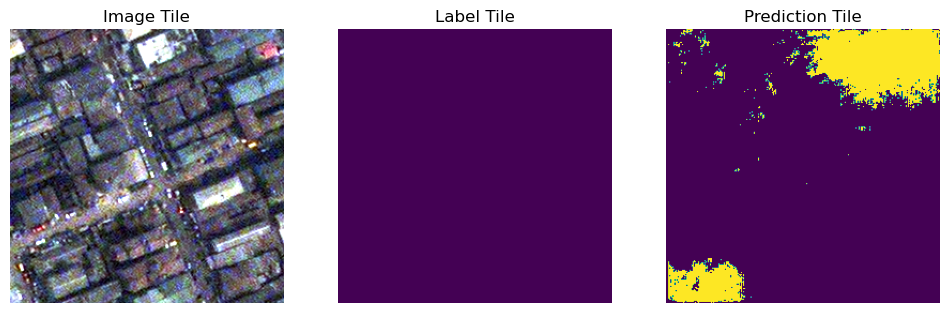

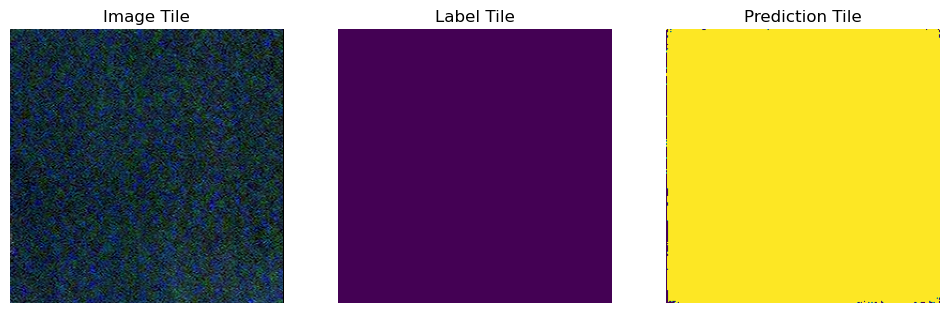

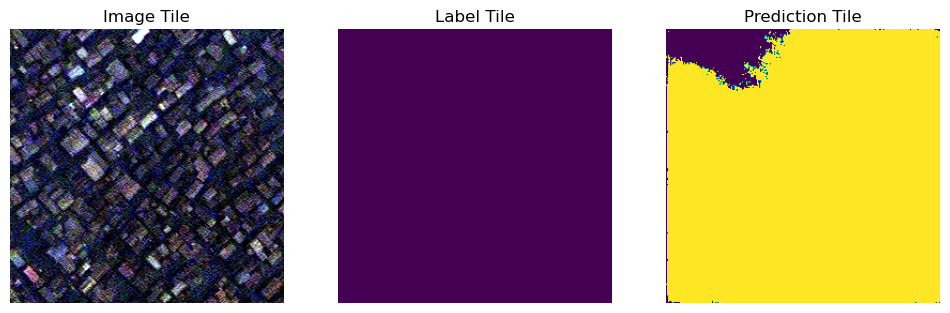

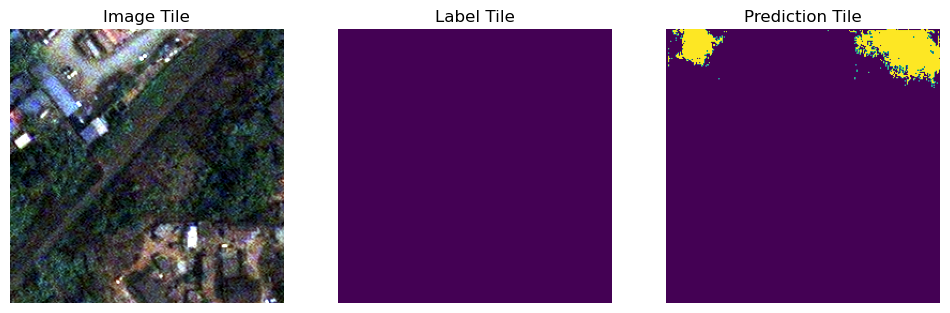

In [45]:
# Select 4 random indices
random_indices = random.sample(range(len(test_dataloader_mak.dataset)), 4)

# Iterate over the random indices and display the image, label, and prediction tiles
for index in random_indices:
    # Get the image, label, and prediction tiles for visualization
    sample = test_dataloader_mak.dataset[index]
    image_tile = sample[0].numpy()
    label_tile = sample[1].numpy()
    prediction_tile = predictions_mak_all[index]

    # Display the image, label, and prediction tiles using matplotlib
    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    axs[0].imshow(image_tile)
    axs[0].set_title('Image Tile')
    axs[0].axis('off')
    axs[1].imshow(label_tile)
    axs[1].set_title('Label Tile')
    axs[1].axis('off')
    axs[2].imshow(prediction_tile)
    axs[2].set_title('Prediction Tile')
    axs[2].axis('off')

    plt.show()

# Medellín

In [31]:
# mak
train_tiles_tensor_med = torch.Tensor(augmented_train_tiles_med)
train_labels_tensor_med = torch.Tensor(augmented_train_labels_med)

valid_tiles_tensor_med = torch.Tensor(valid_tiles_med)
valid_labels_tensor_med = torch.Tensor(valid_labels_med)

test_tiles_tensor_med = torch.Tensor(test_tiles_med)
test_labels_tensor_med = torch.Tensor(test_labels_med)

train_data_med = TensorDataset(train_tiles_tensor_med, train_labels_tensor_med)
valid_data_med = TensorDataset(valid_tiles_tensor_med, valid_labels_tensor_med)
test_data_med = TensorDataset(test_tiles_tensor_med, test_labels_tensor_med)

train_dataloader_med = DataLoader(train_data_med, batch_size=batch_size, collate_fn=custom_collate_fn, shuffle=True)
valid_dataloader_med = DataLoader(valid_data_med, batch_size=batch_size, collate_fn=custom_collate_fn, shuffle=True)
test_dataloader_med = DataLoader(test_data_med, batch_size=batch_size, collate_fn=custom_collate_fn, shuffle=True)

# Let's save the test set, as we'll need it later to do across-slum predictions
with open('/kaggle/working/test_dataloader_med.pkl', 'wb') as file:
    pickle.dump(test_dataloader_med, file)
    
# Kaggle keeps crashing due to memory issues, so I'll save also train and eval, re-start the session and start again from here
with open('/kaggle/working/train_dataloader_med.pkl', 'wb') as file:
    pickle.dump(train_dataloader_med, file)
    
with open('/kaggle/working/valid_dataloader_med.pkl', 'wb') as file:
    pickle.dump(valid_dataloader_med, file)


/tmp/ipykernel_28/3720732856.py:5: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /usr/local/src/pytorch/torch/csrc/utils/tensor_new.cpp:245.)
  valid_tiles_tensor_med = torch.Tensor(valid_tiles_med)


In [8]:
# Load train dataloader
with open('/kaggle/input/medellin-split/train_dataloader_med.pkl', 'rb') as file:
    train_dataloader_med = pickle.load(file)

# Load validation dataloader
with open('/kaggle/input/medellin-split/valid_dataloader_med.pkl', 'rb') as file:
    valid_dataloader_med = pickle.load(file)


## Model creation

In [14]:
model_med = create_model()
model_med.to(device) 
optimizer = torch.optim.Adam(model_med.parameters(), lr=learning_rate)


In [15]:
# med
train_loss_dict={}
val_loss_dict={}

for epoch in range(epochs):
    print('Epoch: [{}/{}]'.format(epoch+1, epochs))

    # TRAINING SET
    
    pbar = tqdm(train_dataloader_med)
    train_loss = 0.0
    model_med.train()
    eval_logger = EvalTracker()
    
    for batch_tile, batch_label  in pbar:
        
        # load image and mask into device memory
        image = batch_tile.to(device) #batch['image'].to(device)
        mask =  batch_label.to(device) #batch['mask'].to(device)

        # pass images into model
        pred = model_med(image)

        # get loss
        loss = criteria_no_weights(pred, mask.to(torch.long)) # mask was previously float so now converted to long (integer equivalent)

        # update the model
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
               
        # compute and display progress
        eval_logger.update(pred, mask)
        mIoU, Prec, Rec, f1 = eval_logger.get_mean()
        pbar.set_description('Loss: {0:1.4f} | mIoU {1:1.4f} | Prec {2:1.4f} | Rec {3:1.4f}  | F1 score {4:1.4f}'.format(loss.item(), mIoU, Prec, Rec, f1))
        train_loss += loss.item() * image.size(0)
    
    # calculate the average loss for training
    train_loss /= len(train_dataloader_med.dataset)
    train_loss_dict[epoch] = train_loss
    
    
    # VALIDATION set
    
    pbar = tqdm(valid_dataloader_med)
    model_med.eval()
    eval_logger = EvalTracker()
    val_loss = 0.0
    with torch.no_grad():
        for batch in pbar:
            # load image and mask into device memory
            image = batch_tile.to(device) #batch['image'].to(device)
            mask =  batch_label.to(device) #batch['mask'].to(device)

            # pass images into model
            pred = model_med(image)

            # get loss
            loss = criteria_no_weights(pred, mask.to(torch.long))
                       
            # compute and display progress
            eval_logger.update(pred, mask)
            mIoU, Prec, Rec, f1 = eval_logger.get_mean()
            pbar.set_description('Loss: {0:1.4f} | mIoU {1:1.4f} | Prec {2:1.4f} | Rec {3:1.4f}  | F1 score {4:1.4f}'.format(loss.item(), mIoU, Prec, Rec, f1))
            val_loss += loss.item() * image.size(0)
    
    # calculate the average loss for validation
    val_loss /= len(valid_dataloader_med.dataset)
    val_loss_dict[epoch] = val_loss
    
# Save the training loss values
with open('./train_loss_med.pkl', 'wb') as file:
    pickle.dump(train_loss_dict, file)
     
# Save the validation loss values
with open('./val_loss_med.pkl', 'wb') as file:
    pickle.dump(val_loss_dict, file)            
# save model
torch.save(model_med.state_dict(), 'model_med.pt')

Epoch: [1/15]


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: [2/15]


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: [3/15]


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: [4/15]


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: [5/15]


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: [6/15]


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: [7/15]


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: [8/15]


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: [9/15]


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: [10/15]


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: [11/15]


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: [12/15]


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: [13/15]


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: [14/15]


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: [15/15]


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

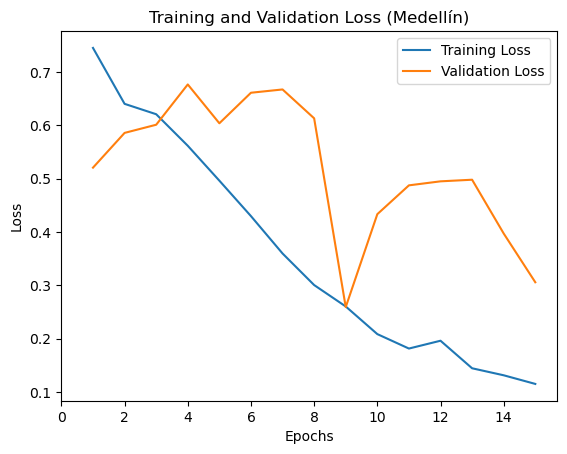

In [18]:
# Load the training and validation loss dictionaries
train_loss = load(open('/kaggle/working/train_loss_med.pkl', 'rb'))
val_loss = load(open('/kaggle/working/val_loss_med.pkl', 'rb'))
 
# Retrieve each dictionary's values
train_values = train_loss.values()
val_values = val_loss.values()
 
# Generate a sequence of integers to represent the epoch numbers
epochs_range = range(1, epochs+1)
 
# Plot and label the training and validation loss values
plt.plot(epochs_range, train_values, label='Training Loss')
plt.plot(epochs_range, val_values, label='Validation Loss')
 
# Add in a title and axes labels
plt.title('Training and Validation Loss (Medellín)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
 
# Set the tick locations
plt.xticks(np.arange(0, epochs+1, 2))
 
# Display the plot
plt.legend(loc='best')
plt.show()

## Out-of-sample metrics for within-slum predictions in Medellín:

In [19]:
model_med = create_model()
model_med.to(device)
model_med.load_state_dict(torch.load('/kaggle/working/model_med.pt'))
model_med.eval()


Unet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track

In [21]:
with open('/kaggle/input/across-preds/test_dataloader_med.pkl', 'rb') as file:
    test_dataloader_med = pickle.load(file)

In [22]:
predictions_med = []
eval_logger = EvalTracker()
with torch.no_grad():
    for batch_tile, batch_label in tqdm(test_dataloader_med):
        # Load image and mask into device memory
        image = batch_tile.to(device)
        mask = batch_label.to(device)

        # Pass images into the model
        pred = model_med(image)

        # Update evaluation tracker
        eval_logger.update(pred, mask)
        
        # compute class predictions, i.e. slum or no slum
        class_pred = pred.argmax(dim=1)
        # convert class prediction to numpy
        class_pred = class_pred.detach().cpu().numpy()
        predictions_med.append(class_pred.astype('uint8'))

predictions_med_all = np.concatenate(predictions_med, axis=0)
# Get the evaluation metrics
mIoU, Prec, Rec, f1 = eval_logger.get_mean()
print("Test Results - mIoU: {:.4f} | Precision: {:.4f} | Recall: {:.4f} | F1 Score: {:.4f}".format(mIoU, Prec, Rec, f1))

  0%|          | 0/2 [00:00<?, ?it/s]

Test Results - mIoU: 0.6252 | Precision: 0.6639 | Recall: 0.9146 | F1 Score: 0.7694


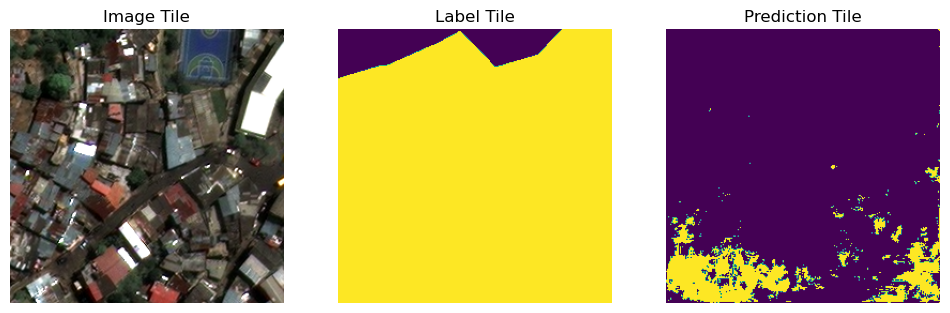

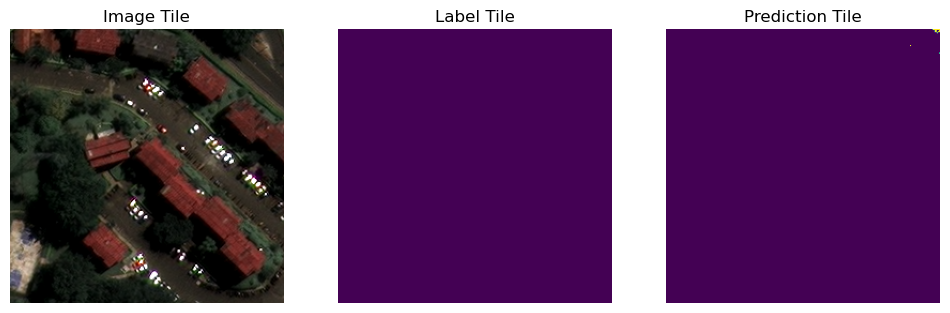

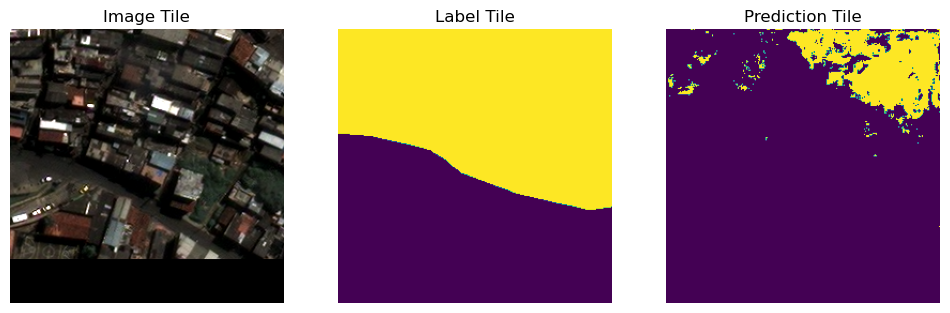

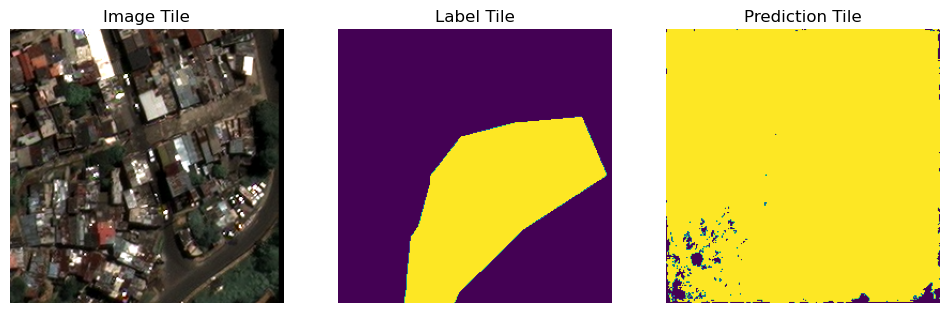

In [25]:
# Select 4 random indices
random_indices = random.sample(range(len(test_dataloader_med.dataset)), 4)

# Iterate over the random indices and display the image, label, and prediction tiles
for index in random_indices:
    # Get the image, label, and prediction tiles for visualization
    sample = test_dataloader_med.dataset[index]
    image_tile = sample[0].numpy()
    label_tile = sample[1].numpy()
    prediction_tile = predictions_med_all[index]

    # Display the image, label, and prediction tiles using matplotlib
    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    axs[0].imshow(image_tile)
    axs[0].set_title('Image Tile')
    axs[0].axis('off')
    axs[1].imshow(label_tile)
    axs[1].set_title('Label Tile')
    axs[1].axis('off')
    axs[2].imshow(prediction_tile)
    axs[2].set_title('Prediction Tile')
    axs[2].axis('off')

    plt.show()

# Within-slum predictions: Summary

We have obtained out-of-sample predictions for within-slum exercises with the following precision metrics:

|           	| Lower Nairobi,  Kenya 	| Kibera, Kenya 	| Makoko, Nigeria 	| Medellín, Colombia 	|
|-----------	|-------------------------	|-----------------------	|-----------------	|--------------------	|
| mIoU      	| 0.4773                  	| 0.4110                	| 0.5119          	| 0.6252             	|
| Precision 	| 0.8524                  	| 0.7256                	| 0.5615          	| 0.6639             	|
| Recall    	| 0.5203                  	| 0.4867                	| 0.8529          	| 0.9146             	|
| F1 score  	| 0.6462                  	| 0.5826                	| 0.6772          	| 0.7694             	|



# Across-slum predictions

Now let's see what happens when we try to predict slum locations based on a model trained in a different area.

## Lower Nairobi

In [26]:
with open('/kaggle/input/test-dataloader-kib-l/test_dataloader_kib_l.pkl', 'rb') as file:
    test_dataloader_kib_l = pickle.load(file)

### Kibera model

In [27]:
model_kib = create_model()
model_kib.to(device)
model_kib.load_state_dict(torch.load('/kaggle/input/model-kib/model_kib.pt'))
model_kib.eval()

Unet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track

In [30]:
predictions_across_kibl_1 = []
eval_logger = EvalTracker()
with torch.no_grad():
    for batch_tile, batch_label in tqdm(test_dataloader_kib_l):
        # Load image and mask into device memory
        image = batch_tile.to(device)
        mask = batch_label.to(device)

        # Pass images into the model
        pred = model_kib(image)

        # Update evaluation tracker
        eval_logger.update(pred, mask)
        
        # compute class predictions, i.e. slum or no slum
        class_pred = pred.argmax(dim=1)
        # convert class prediction to numpy
        class_pred = class_pred.detach().cpu().numpy()
        predictions_across_kibl_1.append(class_pred.astype('uint8'))

predictions_across_kibl_1_all = np.concatenate(predictions_across_kibl_1, axis=0)
# Get the evaluation metrics
mIoU, Prec, Rec, f1 = eval_logger.get_mean()
print("Test Results - mIoU: {:.4f} | Precision: {:.4f} | Recall: {:.4f} | F1 Score: {:.4f}".format(mIoU, Prec, Rec, f1))

  0%|          | 0/5 [00:00<?, ?it/s]

Test Results - mIoU: 0.0307 | Precision: 0.1165 | Recall: 0.0400 | F1 Score: 0.0595


### Makoko model

In [31]:
model_mak = create_model()
model_mak.to(device)
model_mak.load_state_dict(torch.load('/kaggle/input/across-preds/model_mak.pt'))
model_mak.eval()

Unet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track

In [32]:
predictions_across_kibl = []
eval_logger = EvalTracker()
with torch.no_grad():
    for batch_tile, batch_label in tqdm(test_dataloader_kib_l):
        # Load image and mask into device memory
        image = batch_tile.to(device)
        mask = batch_label.to(device)

        # Pass images into the model
        pred = model_mak(image)

        # Update evaluation tracker
        eval_logger.update(pred, mask)
        
        # compute class predictions, i.e. slum or no slum
        class_pred = pred.argmax(dim=1)
        # convert class prediction to numpy
        class_pred = class_pred.detach().cpu().numpy()
        predictions_across_kibl_1.append(class_pred.astype('uint8'))

predictions_across_kibl_1_all = np.concatenate(predictions_across_kibl_1, axis=0)
# Get the evaluation metrics
mIoU, Prec, Rec, f1 = eval_logger.get_mean()
print("Test Results - mIoU: {:.4f} | Precision: {:.4f} | Recall: {:.4f} | F1 Score: {:.4f}".format(mIoU, Prec, Rec, f1))

  0%|          | 0/5 [00:00<?, ?it/s]

Test Results - mIoU: 0.1459 | Precision: 0.2603 | Recall: 0.2494 | F1 Score: 0.2547


### Medellín model

In [33]:
model_med = create_model()
model_med.to(device)
model_med.load_state_dict(torch.load('/kaggle/input/model-med/model_med.pt'))
model_med.eval()

Unet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track

In [34]:
predictions_across_kibl = []
eval_logger = EvalTracker()
with torch.no_grad():
    for batch_tile, batch_label in tqdm(test_dataloader_kib_l):
        # Load image and mask into device memory
        image = batch_tile.to(device)
        mask = batch_label.to(device)

        # Pass images into the model
        pred = model_med(image)

        # Update evaluation tracker
        eval_logger.update(pred, mask)
        
        # compute class predictions, i.e. slum or no slum
        class_pred = pred.argmax(dim=1)
        # convert class prediction to numpy
        class_pred = class_pred.detach().cpu().numpy()
        predictions_across_kibl_1.append(class_pred.astype('uint8'))

predictions_across_kibl_1_all = np.concatenate(predictions_across_kibl_1, axis=0)
# Get the evaluation metrics
mIoU, Prec, Rec, f1 = eval_logger.get_mean()
print("Test Results - mIoU: {:.4f} | Precision: {:.4f} | Recall: {:.4f} | F1 Score: {:.4f}".format(mIoU, Prec, Rec, f1))

  0%|          | 0/5 [00:00<?, ?it/s]

Test Results - mIoU: 0.1560 | Precision: 0.1638 | Recall: 0.7669 | F1 Score: 0.2699


## Across-slums predictions for Kibera

In [35]:
with open('/kaggle/input/kib-split/test_dataloader_kib.pkl', 'rb') as file:
    test_dataloader_kib = pickle.load(file)

### Lower Nairobi model

In [37]:
model_kibl = create_model()
model_kibl.to(device)
model_kibl.load_state_dict(torch.load('/kaggle/input/model-kib-l/model_kib_l.pt'))
model_kibl.eval()

Unet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track

In [38]:
predictions_across_kib = []
eval_logger = EvalTracker()
with torch.no_grad():
    for batch_tile, batch_label in tqdm(test_dataloader_kib):
        # Load image and mask into device memory
        image = batch_tile.to(device)
        mask = batch_label.to(device)

        # Pass images into the model
        pred = model_kibl(image)

        # Update evaluation tracker
        eval_logger.update(pred, mask)
        
        # compute class predictions, i.e. slum or no slum
        class_pred = pred.argmax(dim=1)
        # convert class prediction to numpy
        class_pred = class_pred.detach().cpu().numpy()
        predictions_across_kib.append(class_pred.astype('uint8'))

predictions_across_kib_all = np.concatenate(predictions_across_kib, axis=0)
# Get the evaluation metrics
mIoU, Prec, Rec, f1 = eval_logger.get_mean()
print("Test Results - mIoU: {:.4f} | Precision: {:.4f} | Recall: {:.4f} | F1 Score: {:.4f}".format(mIoU, Prec, Rec, f1))

  0%|          | 0/13 [00:00<?, ?it/s]

Test Results - mIoU: 0.1023 | Precision: 0.8258 | Recall: 0.1045 | F1 Score: 0.1855


### Makoko model

In [39]:
predictions_across_kib = []
eval_logger = EvalTracker()
with torch.no_grad():
    for batch_tile, batch_label in tqdm(test_dataloader_kib):
        # Load image and mask into device memory
        image = batch_tile.to(device)
        mask = batch_label.to(device)

        # Pass images into the model
        pred = model_mak(image)

        # Update evaluation tracker
        eval_logger.update(pred, mask)
        
        # compute class predictions, i.e. slum or no slum
        class_pred = pred.argmax(dim=1)
        # convert class prediction to numpy
        class_pred = class_pred.detach().cpu().numpy()
        predictions_across_kib.append(class_pred.astype('uint8'))

predictions_across_kib_all = np.concatenate(predictions_across_kib, axis=0)
# Get the evaluation metrics
mIoU, Prec, Rec, f1 = eval_logger.get_mean()
print("Test Results - mIoU: {:.4f} | Precision: {:.4f} | Recall: {:.4f} | F1 Score: {:.4f}".format(mIoU, Prec, Rec, f1))

  0%|          | 0/13 [00:00<?, ?it/s]

Test Results - mIoU: 0.0915 | Precision: 0.4594 | Recall: 0.1025 | F1 Score: 0.1676


### Medellín model

In [36]:
predictions_across_kib = []
eval_logger = EvalTracker()
with torch.no_grad():
    for batch_tile, batch_label in tqdm(test_dataloader_kib):
        # Load image and mask into device memory
        image = batch_tile.to(device)
        mask = batch_label.to(device)

        # Pass images into the model
        pred = model_med(image)

        # Update evaluation tracker
        eval_logger.update(pred, mask)
        
        # compute class predictions, i.e. slum or no slum
        class_pred = pred.argmax(dim=1)
        # convert class prediction to numpy
        class_pred = class_pred.detach().cpu().numpy()
        predictions_across_kib.append(class_pred.astype('uint8'))

predictions_across_kib_all = np.concatenate(predictions_across_kib, axis=0)
# Get the evaluation metrics
mIoU, Prec, Rec, f1 = eval_logger.get_mean()
print("Test Results - mIoU: {:.4f} | Precision: {:.4f} | Recall: {:.4f} | F1 Score: {:.4f}".format(mIoU, Prec, Rec, f1))

  0%|          | 0/13 [00:00<?, ?it/s]

Test Results - mIoU: 0.3680 | Precision: 0.4372 | Recall: 0.6993 | F1 Score: 0.5381


## Across-slum predictions for Makoko

In [40]:
with open('/kaggle/input/across-preds/test_dataloader_mak.pkl', 'rb') as file:
    test_dataloader_mak = pickle.load(file)

### Lower Nairobi model

In [41]:
predictions_across_mak = []
eval_logger = EvalTracker()
with torch.no_grad():
    for batch_tile, batch_label in tqdm(test_dataloader_mak):
        # Load image and mask into device memory
        image = batch_tile.to(device)
        mask = batch_label.to(device)

        # Pass images into the model
        pred = model_kibl(image)

        # Update evaluation tracker
        eval_logger.update(pred, mask)
        
        # compute class predictions, i.e. slum or no slum
        class_pred = pred.argmax(dim=1)
        # convert class prediction to numpy
        class_pred = class_pred.detach().cpu().numpy()
        predictions_across_mak.append(class_pred.astype('uint8'))

predictions_across_mak_all = np.concatenate(predictions_across_mak, axis=0)
# Get the evaluation metrics
mIoU, Prec, Rec, f1 = eval_logger.get_mean()
print("Test Results - mIoU: {:.4f} | Precision: {:.4f} | Recall: {:.4f} | F1 Score: {:.4f}".format(mIoU, Prec, Rec, f1))

  0%|          | 0/3 [00:00<?, ?it/s]

Test Results - mIoU: 0.0003 | Precision: 0.0724 | Recall: 0.0003 | F1 Score: 0.0006


### Kibera model

In [42]:
predictions_across_mak = []
eval_logger = EvalTracker()
with torch.no_grad():
    for batch_tile, batch_label in tqdm(test_dataloader_mak):
        # Load image and mask into device memory
        image = batch_tile.to(device)
        mask = batch_label.to(device)

        # Pass images into the model
        pred = model_kib(image)

        # Update evaluation tracker
        eval_logger.update(pred, mask)
        
        # compute class predictions, i.e. slum or no slum
        class_pred = pred.argmax(dim=1)
        # convert class prediction to numpy
        class_pred = class_pred.detach().cpu().numpy()
        predictions_across_mak.append(class_pred.astype('uint8'))

predictions_across_mak_all = np.concatenate(predictions_across_mak, axis=0)
# Get the evaluation metrics
mIoU, Prec, Rec, f1 = eval_logger.get_mean()
print("Test Results - mIoU: {:.4f} | Precision: {:.4f} | Recall: {:.4f} | F1 Score: {:.4f}".format(mIoU, Prec, Rec, f1))

  0%|          | 0/3 [00:00<?, ?it/s]

Test Results - mIoU: 0.0000 | Precision: 0.0000 | Recall: 0.0000 | F1 Score: 0.0000


### Medellín model

In [43]:
predictions_across_mak = []
eval_logger = EvalTracker()
with torch.no_grad():
    for batch_tile, batch_label in tqdm(test_dataloader_mak):
        # Load image and mask into device memory
        image = batch_tile.to(device)
        mask = batch_label.to(device)

        # Pass images into the model
        pred = model_med(image)

        # Update evaluation tracker
        eval_logger.update(pred, mask)
        
        # compute class predictions, i.e. slum or no slum
        class_pred = pred.argmax(dim=1)
        # convert class prediction to numpy
        class_pred = class_pred.detach().cpu().numpy()
        predictions_across_mak.append(class_pred.astype('uint8'))

predictions_across_mak_all = np.concatenate(predictions_across_mak, axis=0)
# Get the evaluation metrics
mIoU, Prec, Rec, f1 = eval_logger.get_mean()
print("Test Results - mIoU: {:.4f} | Precision: {:.4f} | Recall: {:.4f} | F1 Score: {:.4f}".format(mIoU, Prec, Rec, f1))

  0%|          | 0/3 [00:00<?, ?it/s]

Test Results - mIoU: 0.2852 | Precision: 0.2859 | Recall: 0.9915 | F1 Score: 0.4438


## Across-slum predictions for Medellín

In [ ]:
with open('/kaggle/input/across-preds/test_dataloader_med.pkl', 'rb') as file:
    test_dataloader_med = pickle.load(file)

### Lower Nairobi model

In [44]:
predictions_across_med = []
eval_logger = EvalTracker()
with torch.no_grad():
    for batch_tile, batch_label in tqdm(test_dataloader_med):
        # Load image and mask into device memory
        image = batch_tile.to(device)
        mask = batch_label.to(device)

        # Pass images into the model
        pred = model_kibl(image)

        # Update evaluation tracker
        eval_logger.update(pred, mask)
        
        # compute class predictions, i.e. slum or no slum
        class_pred = pred.argmax(dim=1)
        # convert class prediction to numpy
        class_pred = class_pred.detach().cpu().numpy()
        predictions_across_med.append(class_pred.astype('uint8'))

predictions_across_med_all = np.concatenate(predictions_across_med, axis=0)
# Get the evaluation metrics
mIoU, Prec, Rec, f1 = eval_logger.get_mean()
print("Test Results - mIoU: {:.4f} | Precision: {:.4f} | Recall: {:.4f} | F1 Score: {:.4f}".format(mIoU, Prec, Rec, f1))

  0%|          | 0/2 [00:00<?, ?it/s]

Test Results - mIoU: 0.0000 | Precision: 0.4105 | Recall: 0.0000 | F1 Score: 0.0001


### Kibera model

In [45]:
predictions_across_med = []
eval_logger = EvalTracker()
with torch.no_grad():
    for batch_tile, batch_label in tqdm(test_dataloader_med):
        # Load image and mask into device memory
        image = batch_tile.to(device)
        mask = batch_label.to(device)

        # Pass images into the model
        pred = model_kib(image)

        # Update evaluation tracker
        eval_logger.update(pred, mask)
        
        # compute class predictions, i.e. slum or no slum
        class_pred = pred.argmax(dim=1)
        # convert class prediction to numpy
        class_pred = class_pred.detach().cpu().numpy()
        predictions_across_med.append(class_pred.astype('uint8'))

predictions_across_med_all = np.concatenate(predictions_across_med, axis=0)
# Get the evaluation metrics
mIoU, Prec, Rec, f1 = eval_logger.get_mean()
print("Test Results - mIoU: {:.4f} | Precision: {:.4f} | Recall: {:.4f} | F1 Score: {:.4f}".format(mIoU, Prec, Rec, f1))

  0%|          | 0/2 [00:00<?, ?it/s]

Test Results - mIoU: 0.0139 | Precision: 0.1485 | Recall: 0.0152 | F1 Score: 0.0275


### Makoko model

In [46]:
predictions_across_med = []
eval_logger = EvalTracker()
with torch.no_grad():
    for batch_tile, batch_label in tqdm(test_dataloader_med):
        # Load image and mask into device memory
        image = batch_tile.to(device)
        mask = batch_label.to(device)

        # Pass images into the model
        pred = model_mak(image)

        # Update evaluation tracker
        eval_logger.update(pred, mask)
        
        # compute class predictions, i.e. slum or no slum
        class_pred = pred.argmax(dim=1)
        # convert class prediction to numpy
        class_pred = class_pred.detach().cpu().numpy()
        predictions_across_med.append(class_pred.astype('uint8'))

predictions_across_med_all = np.concatenate(predictions_across_med, axis=0)
# Get the evaluation metrics
mIoU, Prec, Rec, f1 = eval_logger.get_mean()
print("Test Results - mIoU: {:.4f} | Precision: {:.4f} | Recall: {:.4f} | F1 Score: {:.4f}".format(mIoU, Prec, Rec, f1))

  0%|          | 0/2 [00:00<?, ?it/s]

Test Results - mIoU: 0.2686 | Precision: 0.5612 | Recall: 0.3400 | F1 Score: 0.4234


## Across-slum predictions: Summary

| Slum to predict 	| Precision  Metric 	| Model trained in: 	|        	|        	|          	|
|:---------------:	|:-----------------:	|:-----------------:	|:------:	|:------:	|:--------:	|
| Slum to predict 	| Precision  Metric 	|   Lower Nairobi   	| Kibera 	| Makoko 	| Medellín 	|
| Lower Nairobi   	| mIoU              	| 0.4773            	| 0.0307 	| 0.1459 	| 0.1560   	|
|                 	| Precision         	| 0.8524            	| 0.1165 	| 0.2603 	| 0.1638   	|
|                 	| Recall            	| 0.5203            	| 0.0400 	| 0.2494 	| 0.7669   	|
|                 	| F1-Score          	| 0.6462            	| 0.0595 	| 0.2547 	| 0.2699   	|
| Kibera          	| mIoU              	| 0.1023            	| 0.4110 	| 0.0915 	| 0.3680   	|
|                 	| Precision         	| 0.8258            	| 0.7256 	| 0.4594 	| 0.4372   	|
|                 	| Recall            	| 0.1045            	| 0.4867 	| 0.1025 	| 0.6993   	|
|                 	| F1-Score          	| 0.1855            	| 0.5826 	| 0.1676 	| 0.5381   	|
| Makoko          	| mIoU              	| 0.0003            	| 0.0000 	| 0.5119 	| 0.2852   	|
|                 	| Precision         	| 0.0724            	| 0.0000 	| 0.5615 	| 0.2859   	|
|                 	| Recall            	| 0.0003            	| 0.0000 	| 0.8529 	| 0.9915   	|
|                 	| F1-Score          	| 0.0006            	| 0.0000 	| 0.6772 	| 0.4438   	|
| Medellín        	| mIoU              	| 0.0000            	| 0.0139 	| 0.2686 	| 0.6252   	|
|                 	| Precision         	| 0.4105            	| 0.1485 	| 0.5612 	| 0.6639   	|
|                 	| Recall            	| 0.0000            	| 0.0152 	| 0.3400 	| 0.9146   	|
|                 	| F1-Score          	| 0.0001            	| 0.0275 	| 0.4234 	| 0.7694   	|